# Risk analytics in banking and financial services

# Using EDA to understand how consumer attributes and loan attributes influence the tendency to default

In [1]:
# Importing the useful libraries

import pandas as pd, numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Importing the application data to be stored as curr_app

curr_app = pd.read_csv('application_data.csv')
pd.options.display.max_columns = None
curr_app.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.079,0.0554,0.0,0.0,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

In [3]:
# Importing the previous application data as prev_app

prev_app = pd.read_csv('previous_application.csv')
pd.options.display.max_columns = None
prev_app.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,Y,1,0.0,0.182832,0.867336,XAP,Approved,-73,Cash through the bank,XAP,NaN,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-301,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,Y,1,NaN,NaN,NaN,XNA,Approved,-512,Cash through the bank,XAP,NaN,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,Y,1,NaN,NaN,NaN,Repairs,Refused,-781,Cash through the bank,HC,NaN,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


# Data Cleaning on both the dataset

In [4]:
curr_app.shape

(307511, 122)

In [5]:
curr_app.columns,len(curr_app.columns)

(Index(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER',
        'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
        'AMT_CREDIT', 'AMT_ANNUITY',
        ...
        'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20',
        'FLAG_DOCUMENT_21', 'AMT_REQ_CREDIT_BUREAU_HOUR',
        'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK',
        'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT',
        'AMT_REQ_CREDIT_BUREAU_YEAR'],
       dtype='object', length=122),
 122)

In [6]:
## Finding the percentage of null values in application dataset rather than absolute value for better visualization

curr_app_per = round (100 * (curr_app.isnull().sum()/len(curr_app.index)),  2 )
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
curr_app_per

SK_ID_CURR                       0.00
TARGET                           0.00
NAME_CONTRACT_TYPE               0.00
CODE_GENDER                      0.00
FLAG_OWN_CAR                     0.00
FLAG_OWN_REALTY                  0.00
CNT_CHILDREN                     0.00
AMT_INCOME_TOTAL                 0.00
AMT_CREDIT                       0.00
AMT_ANNUITY                      0.00
AMT_GOODS_PRICE                  0.09
NAME_TYPE_SUITE                  0.42
NAME_INCOME_TYPE                 0.00
NAME_EDUCATION_TYPE              0.00
NAME_FAMILY_STATUS               0.00
NAME_HOUSING_TYPE                0.00
REGION_POPULATION_RELATIVE       0.00
DAYS_BIRTH                       0.00
DAYS_EMPLOYED                    0.00
DAYS_REGISTRATION                0.00
DAYS_ID_PUBLISH                  0.00
OWN_CAR_AGE                     65.99
FLAG_MOBIL                       0.00
FLAG_EMP_PHONE                   0.00
FLAG_WORK_PHONE                  0.00
FLAG_CONT_MOBILE                 0.00
FLAG_PHONE  

In [7]:
## Removing the null values more than 19% for better visualization and analysis

curr_app = curr_app.loc[:, curr_app.isnull().mean() <= 0.19]

In [8]:
# Number of columns left after removing null value

len(curr_app.columns)

71

In [9]:
## Checking the data again

round (100 * (curr_app.isnull().sum()/len(curr_app.index)),  2 )

SK_ID_CURR                      0.00
TARGET                          0.00
NAME_CONTRACT_TYPE              0.00
CODE_GENDER                     0.00
FLAG_OWN_CAR                    0.00
FLAG_OWN_REALTY                 0.00
CNT_CHILDREN                    0.00
AMT_INCOME_TOTAL                0.00
AMT_CREDIT                      0.00
AMT_ANNUITY                     0.00
AMT_GOODS_PRICE                 0.09
NAME_TYPE_SUITE                 0.42
NAME_INCOME_TYPE                0.00
NAME_EDUCATION_TYPE             0.00
NAME_FAMILY_STATUS              0.00
NAME_HOUSING_TYPE               0.00
REGION_POPULATION_RELATIVE      0.00
DAYS_BIRTH                      0.00
DAYS_EMPLOYED                   0.00
DAYS_REGISTRATION               0.00
DAYS_ID_PUBLISH                 0.00
FLAG_MOBIL                      0.00
FLAG_EMP_PHONE                  0.00
FLAG_WORK_PHONE                 0.00
FLAG_CONT_MOBILE                0.00
FLAG_PHONE                      0.00
FLAG_EMAIL                      0.00
C

In [10]:
## Performing similar operations on previous application_dataset

prev_app.shape

(1670214, 37)

In [11]:
# Percentage null value

prev_app_per = round (100 * (prev_app.isnull().sum()/len(prev_app.index)),  2 )
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
prev_app_per

SK_ID_PREV                      0.00
SK_ID_CURR                      0.00
NAME_CONTRACT_TYPE              0.00
AMT_ANNUITY                    22.29
AMT_APPLICATION                 0.00
AMT_CREDIT                      0.00
AMT_DOWN_PAYMENT               53.64
AMT_GOODS_PRICE                23.08
WEEKDAY_APPR_PROCESS_START      0.00
HOUR_APPR_PROCESS_START         0.00
FLAG_LAST_APPL_PER_CONTRACT     0.00
NFLAG_LAST_APPL_IN_DAY          0.00
RATE_DOWN_PAYMENT              53.64
RATE_INTEREST_PRIMARY          99.64
RATE_INTEREST_PRIVILEGED       99.64
NAME_CASH_LOAN_PURPOSE          0.00
NAME_CONTRACT_STATUS            0.00
DAYS_DECISION                   0.00
NAME_PAYMENT_TYPE               0.00
CODE_REJECT_REASON              0.00
NAME_TYPE_SUITE                49.12
NAME_CLIENT_TYPE                0.00
NAME_GOODS_CATEGORY             0.00
NAME_PORTFOLIO                  0.00
NAME_PRODUCT_TYPE               0.00
CHANNEL_TYPE                    0.00
SELLERPLACE_AREA                0.00
N

In [12]:
# Removing null values more than 20%

prev_app = prev_app.loc[:, prev_app.isnull().mean() <= 0.20]

In [13]:
len(prev_app.columns)

23

In [14]:
# checking the data again for confirmation
# By looking at the data_set it seems no further cleaning is required in 'previous application_dataset'.

round (100 * (prev_app.isnull().sum()/len(prev_app.index)),  2 )

SK_ID_PREV                     0.00
SK_ID_CURR                     0.00
NAME_CONTRACT_TYPE             0.00
AMT_APPLICATION                0.00
AMT_CREDIT                     0.00
WEEKDAY_APPR_PROCESS_START     0.00
HOUR_APPR_PROCESS_START        0.00
FLAG_LAST_APPL_PER_CONTRACT    0.00
NFLAG_LAST_APPL_IN_DAY         0.00
NAME_CASH_LOAN_PURPOSE         0.00
NAME_CONTRACT_STATUS           0.00
DAYS_DECISION                  0.00
NAME_PAYMENT_TYPE              0.00
CODE_REJECT_REASON             0.00
NAME_CLIENT_TYPE               0.00
NAME_GOODS_CATEGORY            0.00
NAME_PORTFOLIO                 0.00
NAME_PRODUCT_TYPE              0.00
CHANNEL_TYPE                   0.00
SELLERPLACE_AREA               0.00
NAME_SELLER_INDUSTRY           0.00
NAME_YIELD_GROUP               0.00
PRODUCT_COMBINATION            0.02
dtype: float64

# Imputing missing value in curr_app

In [15]:
curr_app.isnull().sum()

SK_ID_CURR                         0
TARGET                             0
NAME_CONTRACT_TYPE                 0
CODE_GENDER                        0
FLAG_OWN_CAR                       0
FLAG_OWN_REALTY                    0
CNT_CHILDREN                       0
AMT_INCOME_TOTAL                   0
AMT_CREDIT                         0
AMT_ANNUITY                       12
AMT_GOODS_PRICE                  278
NAME_TYPE_SUITE                 1292
NAME_INCOME_TYPE                   0
NAME_EDUCATION_TYPE                0
NAME_FAMILY_STATUS                 0
NAME_HOUSING_TYPE                  0
REGION_POPULATION_RELATIVE         0
DAYS_BIRTH                         0
DAYS_EMPLOYED                      0
DAYS_REGISTRATION                  0
DAYS_ID_PUBLISH                    0
FLAG_MOBIL                         0
FLAG_EMP_PHONE                     0
FLAG_WORK_PHONE                    0
FLAG_CONT_MOBILE                   0
FLAG_PHONE                         0
FLAG_EMAIL                         0
C

In [16]:
curr_app[curr_app['NAME_TYPE_SUITE'].isnull()]

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
64,100076,0,Cash loans,M,Y,N,0,180000.0,315000.0,9679.5,315000.0,NaN,Commercial associate,Secondary / secondary special,Married,House / apartment,0.028663,-13866,-2546,-5448.000000,-4097,1,1,0,1,0,0,2.0,2,2,MONDAY,12,0,0,0,0,0,0,Transport: type 3,0.584887,0.0,0.0,0.0,0.0,-3.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
724,100837,0,Revolving loans,F,N,Y,2,45000.0,135000.0,6750.0,NaN,NaN,Commercial associate,Secondary / secondary special,Married,House / apartment,0.024610,-10072,-381,-519.000000,-1834,1,1,1,1,0,0,4.0,2,2,WEDNESDAY,14,0,0,0,0,0,0,Kindergarten,0.378174,2.0,1.0,2.0,1.0,-2011.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
1199,101414,0,Cash loans,M,Y,N,0,135000.0,533668.5,34636.5,477000.0,NaN,Working,Secondary / secondary special,Civil marriage,House / apartment,0.046220,-21717,-2393,-5486.000000,-4513,1,1,0,1,0,0,2.0,1,1,SUNDAY,10,0,0,0,0,0,0,Transport: type 3,0.756676,3.0,0.0,3.0,0.0,-3.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,4.0,0.0,0.0
1669,101954,0,Cash loans,F,Y,N,2,153000.0,1162170.0,30654.0,832500.0,NaN,State servant,Higher education,Separated,House / apartment,0.024610,-12975,-1839,-3896.000000,-2179,1,1,0,1,1,0,3.0,2,2,THURSDAY,12,0,0,0,0,0,0,Government,0.685813,0.0,0.0,0.0,0.0,-2.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
1862,102183,0,Cash loans,F,Y,N,0,121500.0,268659.0,13774.5,243000.0,NaN,Commercial associate,Secondary / secondary special,Married,House / apartment,0.010147,-12870,-2822,-777.000000,-4371,1,1,1,1,1,0,2.0,2,2,THURSDAY,11,0,0,0,0,1,1,Business Entity Type 3,0.492076,2.0,0.0,2.0,0.0,-326.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0.0,0.0,0.0,0.0,2.0,0.0
2271,102661,0,Cash loans,F,N,N,0,225000.0,1890000.0,49986.0,1890000.0,NaN,Commercial associate,Higher education,Single / not married,House / apartment,0.006008,-13279,-4219,-7092.000000,-4170,1,1,0,1,0,0,1.0,2,2,THURSDAY,18,0,0,0,0,1,1,Other,0.724358,8.0,0.0,7.0,0.0,-5.0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2625,103065,0,Cash loans,F,N,Y,1,112500.0,593010.0,16434.0,495000.0,NaN,Working,Secondary / secondary special,Married,With parents,0.018850,-8967,-1801,-4433.000000,-577,1,1,0,1,0,0,3.0,2,2,SATURDAY,10,0,0,0,0,0,0,Trade: type 3,0.757400,0.0,0.0,0.0,0.0,-1695.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
2650,103093,0,Cash loans,M,Y,N,0,360000.0,728460.0,37134.0,675000.0,NaN,State servant,Higher education,Married,Municipal apartment,0.018801,-14724,-3045,-8860.000000,-2051,1,1,0,1,1,0,2.0,2,2,SUNDAY,11,0,0,0,0,0,0,School,0.489758,3.0,0.0,3.0,0.0,-1569.0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3012,10351

In [17]:
curr_app['NAME_TYPE_SUITE'].value_counts()

Unaccompanied      248526
Family              40149
Spouse, partner     11370
Children             3267
Other_B              1770
Other_A               866
Group of people       271
Name: NAME_TYPE_SUITE, dtype: int64

In [18]:
# checking the mode value in the NAME_TYPE_SUITE columns as it is a catagorical column

curr_app['NAME_TYPE_SUITE'].mode()

0    Unaccompanied
Name: NAME_TYPE_SUITE, dtype: object

In [19]:
# filling the NAME_TYPE_SUITE with the mode value i.e. Unaccompanied

curr_app['NAME_TYPE_SUITE'].fillna(value = 'Unaccompanied', inplace=True)

In [20]:
## Handling the Missing values in below mentioned columns.
# checking the mean value in AMT_REQ_CREDIT_BUREAU_HOUR as it is a numerical volumn

curr_app.AMT_REQ_CREDIT_BUREAU_HOUR.mean()

0.006402448193930645

In [21]:
# Checking mean value for other such columns AMT_REQ_CREDIT_BUREAU_DAY, AMT_REQ_CREDIT_BUREAU_WEEK, 
# AMT_REQ_CREDIT_BUREAU_MON, AMT_REQ_CREDIT_BUREAU_QRT, AMT_REQ_CREDIT_BUREAU_YEAR

print(curr_app.AMT_REQ_CREDIT_BUREAU_DAY.mean())
print(curr_app.AMT_REQ_CREDIT_BUREAU_WEEK.mean())
print(curr_app.AMT_REQ_CREDIT_BUREAU_MON.mean())
print(curr_app.AMT_REQ_CREDIT_BUREAU_QRT.mean())
print(curr_app.AMT_REQ_CREDIT_BUREAU_YEAR.mean())

0.0070002105326475985
0.0343619356973142
0.26739526000781977
0.26547414959848414
1.899974435321363


In [22]:
# Now checking the median values for all the above column to be sure before imputing any value

print(curr_app.AMT_REQ_CREDIT_BUREAU_HOUR.median())
print(curr_app.AMT_REQ_CREDIT_BUREAU_DAY.median())
print(curr_app.AMT_REQ_CREDIT_BUREAU_WEEK.median())
print(curr_app.AMT_REQ_CREDIT_BUREAU_MON.median())
print(curr_app.AMT_REQ_CREDIT_BUREAU_QRT.median())
print(curr_app.AMT_REQ_CREDIT_BUREAU_YEAR.median())

0.0
0.0
0.0
0.0
0.0
1.0


In [23]:
# By looking at the Median and Mean value imputing '0' will be appropriate for all of the above mentioned columns
# Although AMT_REQ_CREDIT_BUREAU_YEAR has Median value 1 but imputing 1 might affect the outcome thus imputing '0'

curr_app['AMT_REQ_CREDIT_BUREAU_HOUR'].fillna(0, inplace=True)
curr_app['AMT_REQ_CREDIT_BUREAU_DAY'].fillna(0, inplace=True)
curr_app['AMT_REQ_CREDIT_BUREAU_WEEK'].fillna(0, inplace=True)
curr_app['AMT_REQ_CREDIT_BUREAU_MON'].fillna(0, inplace=True)
curr_app['AMT_REQ_CREDIT_BUREAU_QRT'].fillna(0, inplace=True)
curr_app['AMT_REQ_CREDIT_BUREAU_YEAR'].fillna(0, inplace=True)

In [24]:
# Handling the missing value of AMT_GOODS_PRICE column

curr_app['AMT_GOODS_PRICE'].describe()

count    3.072330e+05
mean     5.383962e+05
std      3.694465e+05
min      4.050000e+04
25%      2.385000e+05
50%      4.500000e+05
75%      6.795000e+05
max      4.050000e+06
Name: AMT_GOODS_PRICE, dtype: float64

In [25]:
curr_app[curr_app['AMT_GOODS_PRICE'].isnull()]

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
724,100837,0,Revolving loans,F,N,Y,2,45000.0,135000.0,6750.0,NaN,Unaccompanied,Commercial associate,Secondary / secondary special,Married,House / apartment,0.024610,-10072,-381,-519.0,-1834,1,1,1,1,0,0,4.0,2,2,WEDNESDAY,14,0,0,0,0,0,0,Kindergarten,0.378174,2.0,1.0,2.0,1.0,-2011.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
5937,106955,0,Revolving loans,F,N,N,0,157500.0,450000.0,22500.0,NaN,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.010006,-11993,-2921,-1289.0,-1948,1,1,1,1,1,1,2.0,2,2,SATURDAY,13,0,0,0,0,0,0,Business Entity Type 3,0.464614,0.0,0.0,0.0,0.0,-476.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,2.0
6425,107494,0,Revolving loans,F,N,N,0,67500.0,202500.0,10125.0,NaN,Unaccompanied,Working,Higher education,Married,House / apartment,0.008474,-9727,-2712,-4132.0,-800,1,1,1,1,1,0,2.0,2,2,WEDNESDAY,18,0,0,0,0,0,0,Trade: type 7,0.565849,1.0,1.0,1.0,0.0,-643.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
6703,107822,0,Revolving loans,F,N,N,1,121500.0,180000.0,9000.0,NaN,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.011657,-11079,-899,-3765.0,-572,1,1,1,1,1,0,3.0,1,1,WEDNESDAY,11,0,0,0,0,0,0,Government,0.645519,1.0,0.0,1.0,0.0,-1292.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
7647,108913,0,Revolving loans,M,N,Y,0,180000.0,450000.0,22500.0,NaN,Unaccompanied,Working,Higher education,Single / not married,House / apartment,0.032561,-9986,-1847,-4762.0,-506,1,1,1,1,1,0,1.0,1,1,SATURDAY,18,0,0,0,0,0,0,Construction,0.552557,1.0,0.0,1.0,0.0,-159.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
7880,109190,1,Revolving loans,F,N,N,0,121500.0,270000.0,13500.0,NaN,Unaccompanied,Working,Higher education,Single / not married,With parents,0.006296,-12390,-640,-6365.0,-3597,1,1,0,1,1,0,1.0,3,3,FRIDAY,16,0,0,0,0,0,0,Business Entity Type 3,0.407925,2.0,0.0,1.0,0.0,-158.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,2.0
7995,109322,0,Revolving loans,M,N,Y,0,112500.0,180000.0,9000.0,NaN,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.008230,-12420,-1610,-6443.0,-2463,1,1,0,1,1,0,1.0,2,2,THURSDAY,16,0,1,1,1,1,1,Security,0.078597,3.0,0.0,3.0,0.0,-2.0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,2.0,3.0
10819,112595,0,Revolving loans,F,N,Y,0,90000.0,270000.0,13500.0,NaN,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.022800,-18193,-242,-1462.0,-1731,1,1,1,1,1,0,2.0,2,2,SUNDAY,15,0,0,0,0,0,0,Transport: type 4,0.644126,0.0,0.0,0.0,0.0,-1952.0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0

In [26]:
## All the missing values here are from Revolving Loans contract Type!
## Almost 99% values are under 18 lakh leaving few which goes all the way upto around 40 lakh

Q = curr_app['AMT_GOODS_PRICE'].quantile(.99)
Q

1800000.0

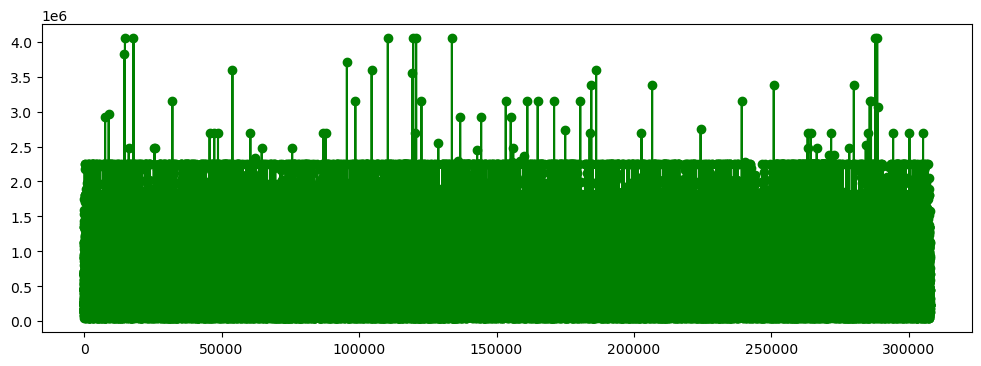

In [27]:
# checking for Outliers

plt.figure(figsize=(12,4))
plt.plot(curr_app['AMT_GOODS_PRICE'], 'green', marker = 'o')
plt.show()

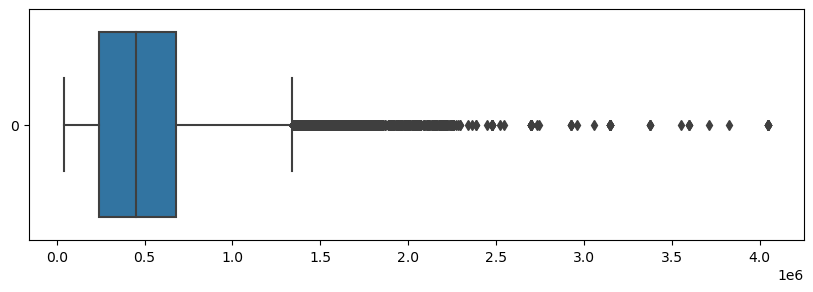

In [28]:
# checking for Outliers

plt.figure(figsize=(10,3))
sns.boxplot(curr_app.AMT_GOODS_PRICE, orient='h')
plt.show()

In [29]:
# Values seems continous with few in higher range as different customers can have different requirment of goods some of which are higher valued than the rest.
# Could be imputed with the Mean value as they are in continous range and we get a fair understanding about the price range of Goods for which customer has applied for loan by looking at the Mean.

# In AMT_GOODS_PRICE column one more possibilty is that since all the missing values are from Revolving loan contract
# type we can also just impute '0' instead of Mean as this category of loan might have issued for some other purpose than buying goods.

# Choosing the second option (Imputing with 0 instead of mean)

curr_app['AMT_GOODS_PRICE'].fillna(value=0, inplace=True)

In [30]:
# Confirming the chnages

curr_app[curr_app.AMT_GOODS_PRICE.isnull()]

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR


In [31]:
# checking for AMT_ANNUITY column

curr_app['AMT_ANNUITY'].describe()

count    307499.000000
mean      27108.573909
std       14493.737315
min        1615.500000
25%       16524.000000
50%       24903.000000
75%       34596.000000
max      258025.500000
Name: AMT_ANNUITY, dtype: float64

In [32]:
curr_app[curr_app['AMT_ANNUITY'].isnull()]

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
47531,155054,0,Cash loans,M,N,N,0,180000.0,450000.0,NaN,450000.0,Unaccompanied,Commercial associate,Incomplete higher,Single / not married,House / apartment,0.026392,-10668,-2523,-4946.0,-3238,1,1,1,1,1,0,1.0,2,2,WEDNESDAY,13,0,0,0,0,0,0,Business Entity Type 3,0.626896,1.0,0.0,1.0,0.0,-2.0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,1.0,1.0
50035,157917,0,Cash loans,F,N,N,0,94500.0,450000.0,NaN,450000.0,Unaccompanied,Working,Lower secondary,Civil marriage,House / apartment,0.035792,-9027,-1270,-3640.0,-741,1,1,1,1,0,0,2.0,2,2,MONDAY,20,0,0,0,0,0,0,Business Entity Type 1,0.727274,0.0,0.0,0.0,0.0,-706.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,1.0,0.0,1.0
51594,159744,0,Cash loans,F,N,N,0,202500.0,539100.0,NaN,450000.0,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.046220,-17376,-3950,-11524.0,-831,1,1,0,1,0,0,2.0,1,1,WEDNESDAY,15,0,0,0,1,1,1,Self-employed,0.738370,1.0,0.0,1.0,0.0,-199.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,1.0,0.0,1.0
55025,163757,0,Cash loans,F,N,N,0,162000.0,296280.0,NaN,225000.0,Unaccompanied,State servant,Higher education,Married,House / apartment,0.035792,-11329,-2040,-3195.0,-3069,1,1,0,1,0,0,2.0,2,2,FRIDAY,13,0,0,0,1,1,1,Government,0.566316,0.0,0.0,0.0,0.0,-2841.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,1.0,0.0,4.0
59934,169487,0,Cash loans,M,Y,N,0,202500.0,360000.0,NaN,360000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.046220,-19762,-2498,-11285.0,-3305,1,1,1,1,1,0,1.0,1,1,FRIDAY,15,0,1,1,0,1,1,Other,0.583947,0.0,0.0,0.0,0.0,-743.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,1.0,0.0,0.0,6.0
75873,187985,0,Cash loans,M,Y,N,0,144000.0,219249.0,NaN,166500.0,Unaccompanied,Working,Higher education,Single / not married,Rented apartment,0.022800,-20831,-2450,-771.0,-4203,1,1,0,1,0,0,1.0,2,2,FRIDAY,15,0,0,0,0,0,0,Business Entity Type 3,0.667564,0.0,0.0,0.0,0.0,-1986.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,11.0
89343,203726,0,Cash loans,F,Y,N,0,90000.0,157500.0,NaN,157500.0,Unaccompanied,State servant,Secondary / secondary special,Married,House / apartment,0.015221,-12134,-3721,-858.0,-591,1,1,0,1,1,0,2.0,2,2,WEDNESDAY,11,0,0,0,0,0,0,Medicine,0.154811,0.0,0.0,0.0,0.0,-348.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,2.0,0.0,0.0
123872,243648,0,Cash loans,F,N,Y,0,202500.0,929088.0,NaN,720000.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.019689,-13902,-3540,-168.0,-4250,1,1,0,1,0,1,2.0,2,2,SATURDAY,12,0,0,0,0,0,0,Self-employed,0.510934,0.0,0.0,0.0,0.0,-1331.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0

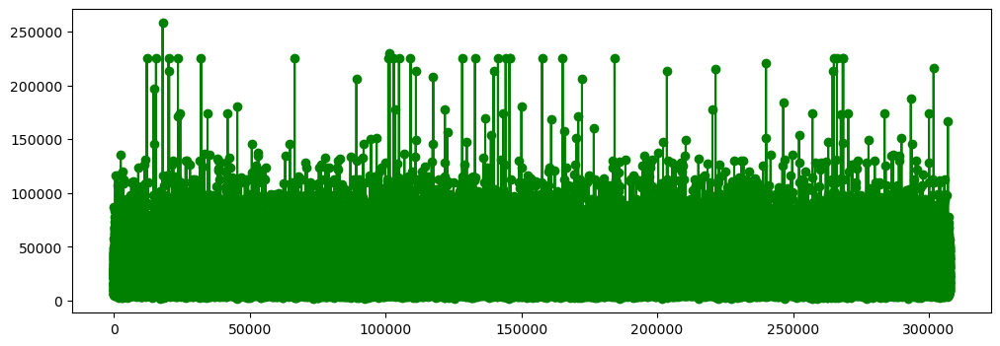

In [33]:
# checking for Outliers

plt.figure(figsize=(12,4))
plt.plot(curr_app['AMT_ANNUITY'], 'green', marker = 'o')
plt.show()

In [34]:
# checking for Outliers

most_of_values = curr_app['AMT_ANNUITY'].quantile(.99)
most_of_values

70006.5

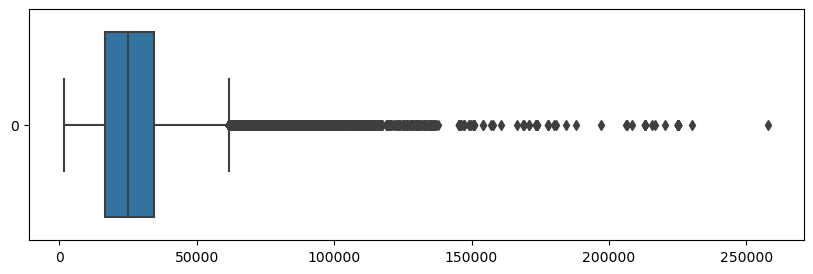

In [35]:
# checking for Outliers

plt.figure(figsize=(10,3))
sns.boxplot(curr_app.AMT_ANNUITY, orient='h')
plt.show()

In [36]:
curr_app.AMT_ANNUITY.median()

24903.0

In [37]:
# For AMT_ANNUITY column outliers are present in data_set as we can see from the plot above.
# Here replacing the value with Mean will distort the analysis as Loan annuity is the fixed amount a debtor needs 
# to pay to the lendor by imputing it with some other value might affect the Credit Analysis. 
# Although only 12 values are missing, So if it's required we can replace 'missing' with Median to avoid outliers effect.

values = curr_app.AMT_ANNUITY.median()
curr_app.loc[curr_app['AMT_ANNUITY'].isnull(), 'AMT_ANNUITY']=values

In [38]:
# Confirming the changes

curr_app[curr_app['AMT_ANNUITY'].isnull()]

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR


In [39]:
# Checking again for the columns that are left for missing values treatment

curr_app.columns[curr_app.isnull().any()].tolist()

['CNT_FAM_MEMBERS',
 'EXT_SOURCE_2',
 'OBS_30_CNT_SOCIAL_CIRCLE',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'OBS_60_CNT_SOCIAL_CIRCLE',
 'DEF_60_CNT_SOCIAL_CIRCLE',
 'DAYS_LAST_PHONE_CHANGE']

# Removing Unwanted columns for ease of Analysis

In [40]:
## Removing Unwanted column from data_set as these are unneccarily making data_set cumbersome!!
## Removing these will not affect the analysis since we weren't going to take these values into account.

unwanted = ['EXT_SOURCE_2','FLAG_DOCUMENT_2','FLAG_DOCUMENT_3','FLAG_DOCUMENT_4','FLAG_DOCUMENT_5','FLAG_DOCUMENT_6',                 
   'FLAG_DOCUMENT_7','FLAG_DOCUMENT_8','FLAG_DOCUMENT_9','FLAG_DOCUMENT_10','FLAG_DOCUMENT_11','FLAG_DOCUMENT_12',               
    'FLAG_DOCUMENT_13','FLAG_DOCUMENT_14','FLAG_DOCUMENT_15','FLAG_DOCUMENT_16','FLAG_DOCUMENT_17','FLAG_DOCUMENT_18',               
    'FLAG_DOCUMENT_19','FLAG_DOCUMENT_20','FLAG_DOCUMENT_21']
curr_app.drop(labels=unwanted, axis=1, inplace=True)

In [41]:
## Dropping few more columns for better visibilty of correlation matrix later on!

unwanted = ['REG_REGION_NOT_LIVE_REGION','REG_REGION_NOT_WORK_REGION','LIVE_REGION_NOT_WORK_REGION',
           'REG_CITY_NOT_LIVE_CITY','REG_CITY_NOT_WORK_CITY','LIVE_CITY_NOT_WORK_CITY','FLAG_MOBIL','FLAG_EMP_PHONE',
            'FLAG_WORK_PHONE','FLAG_CONT_MOBILE','FLAG_PHONE','FLAG_EMAIL']
curr_app.drop(labels=unwanted, axis=1, inplace=True)

In [42]:
# Confirming the above operation
curr_app.shape

(307511, 38)

# Checking the Gender & Organization column for any error

In [43]:
# At first for Gender column

curr_app.CODE_GENDER.value_counts()

F      202448
M      105059
XNA         4
Name: CODE_GENDER, dtype: int64

In [44]:
curr_app['CODE_GENDER'].mode()

0    F
Name: CODE_GENDER, dtype: object

In [45]:
# Replacing the 'XNA' values with the 'F' considering they are in majority(Mode Value)!!

curr_app.CODE_GENDER.replace(to_replace= 'XNA', value = 'F', inplace=True)
curr_app.CODE_GENDER.value_counts()

F    202452
M    105059
Name: CODE_GENDER, dtype: int64

In [46]:
# Secondly for Organization column

curr_app.ORGANIZATION_TYPE.value_counts()

Business Entity Type 3    67992
XNA                       55374
Self-employed             38412
Other                     16683
Medicine                  11193
Business Entity Type 2    10553
Government                10404
School                     8893
Trade: type 7              7831
Kindergarten               6880
Construction               6721
Business Entity Type 1     5984
Transport: type 4          5398
Trade: type 3              3492
Industry: type 9           3368
Industry: type 3           3278
Security                   3247
Housing                    2958
Industry: type 11          2704
Military                   2634
Bank                       2507
Agriculture                2454
Police                     2341
Transport: type 2          2204
Postal                     2157
Security Ministries        1974
Trade: type 2              1900
Restaurant                 1811
Services                   1575
University                 1327
Industry: type 7           1307
Transpor

In [47]:
# Here XNA values are higher in number therefore dropping the rows is the better wayaround.

curr_app = curr_app.drop(curr_app.loc[curr_app['ORGANIZATION_TYPE']=='XNA'].index)

In [48]:
# Confirming the changes
curr_app.ORGANIZATION_TYPE.value_counts()

Business Entity Type 3    67992
Self-employed             38412
Other                     16683
Medicine                  11193
Business Entity Type 2    10553
Government                10404
School                     8893
Trade: type 7              7831
Kindergarten               6880
Construction               6721
Business Entity Type 1     5984
Transport: type 4          5398
Trade: type 3              3492
Industry: type 9           3368
Industry: type 3           3278
Security                   3247
Housing                    2958
Industry: type 11          2704
Military                   2634
Bank                       2507
Agriculture                2454
Police                     2341
Transport: type 2          2204
Postal                     2157
Security Ministries        1974
Trade: type 2              1900
Restaurant                 1811
Services                   1575
University                 1327
Industry: type 7           1307
Transport: type 3          1187
Industry

# Creating Bins for certain columns

In [49]:
curr_app.AMT_INCOME_TOTAL.describe()

count    2.521370e+05
mean     1.759141e+05
std      2.588516e+05
min      2.565000e+04
25%      1.125000e+05
50%      1.575000e+05
75%      2.115000e+05
max      1.170000e+08
Name: AMT_INCOME_TOTAL, dtype: float64

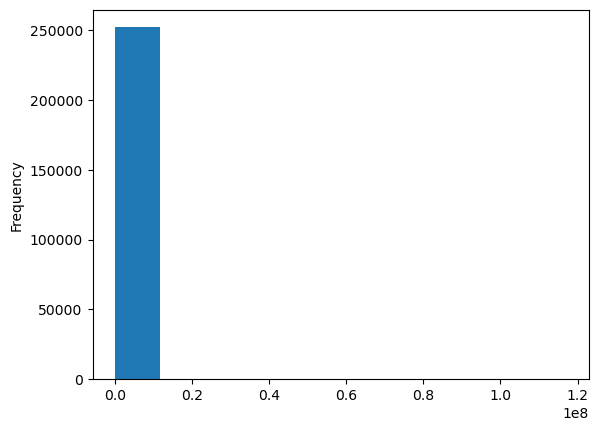

In [50]:
curr_app.AMT_INCOME_TOTAL.plot.hist()
plt.show()

In [51]:
# Creating bins for the Income column for better visualization since nothing conrete can be 
# visualize by looking at the above plot and also all the values are highly skewed towards leftmost range!!

b_income = [0,25000,50000,75000,100000,125000,150000,175000,200000,225000,250000,275000,300000,325000,350000,375000,400000,425000,450000,475000,500000,525000]
slot_i = ['0-25000','25000-50000','50000-75000','75000-100000','100000-125000','125000-150000','150000-175000','175000-200000',
         '200000-225000','225000-250000','250000-275000','275000-300000','300000-325000','325000-350000','350000-375000',
         '375000-400000','400000-425000','425000-450000','450000-475000','475000-500000','500000 and above']

curr_app['AMT_INCOME_RANGE'] = pd.cut(curr_app['AMT_INCOME_TOTAL'], b_income, labels= slot_i)


In [52]:
# Confirming the above changes

curr_app.AMT_INCOME_RANGE.value_counts()

125000-150000       39819
200000-225000       35994
100000-125000       34851
75000-100000        29612
150000-175000       29296
175000-200000       25892
50000-75000         12077
250000-275000       11485
225000-250000        6483
300000-325000        6169
350000-375000        4185
275000-300000        3749
425000-450000        2863
25000-50000          1982
325000-350000        1952
400000-425000        1652
375000-400000        1132
475000-500000         282
450000-475000         119
500000 and above       52
0-25000                 0
Name: AMT_INCOME_RANGE, dtype: int64

In [53]:
## Performing the above operation for AMT_CREDIT columns

curr_app.AMT_CREDIT.describe()

count    2.521370e+05
mean     6.113985e+05
std      4.065272e+05
min      4.500000e+04
25%      2.779695e+05
50%      5.212800e+05
75%      8.292240e+05
max      4.050000e+06
Name: AMT_CREDIT, dtype: float64

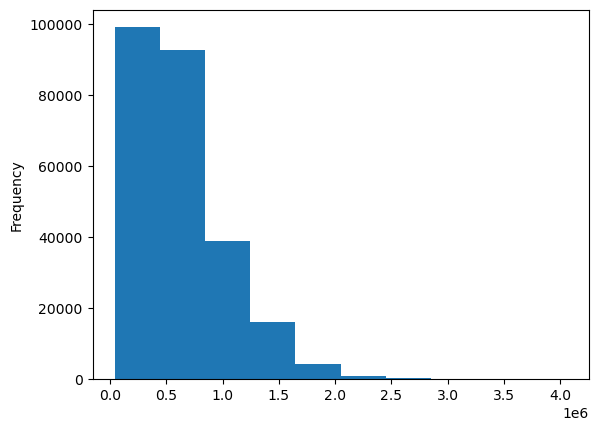

In [54]:
curr_app.AMT_CREDIT.plot.hist()
plt.show()

In [55]:
# Creating bins for the Credit column i.e. AMT_CREDIT as most of its values are skewed towards left

b_credit = [0,150000,200000,250000,300000,350000,400000,450000,500000,550000,600000,650000,700000,750000,800000,850000,
           900000]
slot_credit = ['0-150000','150000-200000','200000-250000','250000-300000','350000-400000','400000-450000','450000-500000',
              '500000-550000','550000-600000','600000-650000','650000-700000','700000-750000','750000-800000','800000-850000',
              '850000-900000','900000 and above']

curr_app['AMT_CREDIT_RANGE'] = pd.cut(curr_app['AMT_CREDIT'], b_credit, labels=slot_credit)

In [56]:
# Confirming the above chnages

curr_app.AMT_CREDIT_RANGE.value_counts()

250000-300000       24961
550000-600000       18434
200000-250000       17502
450000-500000       15854
150000-200000       14867
0-150000            13502
350000-400000       13487
700000-750000       12142
500000-550000       11254
800000-850000        9770
600000-650000        9489
850000-900000        9439
900000 and above     9100
400000-450000        8399
650000-700000        7571
750000-800000        5649
Name: AMT_CREDIT_RANGE, dtype: int64

In [57]:
# Creating bins for summarizing Age of applicants
# Before that we need to convert these to absolute values: DAYS_BIRTH, DAYS_EMPLOYED, DAYS_REGISTRATION, 
# DAYS_ID_PUBLISH.

In [58]:
curr_app.DAYS_BIRTH = curr_app.DAYS_BIRTH.apply(lambda x: abs(x//365))
curr_app.rename({'DAYS_BIRTH':'AGE_IN_YEARS'}, axis=1, inplace=True)

In [59]:
# Confirming the chnages

curr_app.AGE_IN_YEARS.info()

<class 'pandas.core.series.Series'>
Int64Index: 252137 entries, 0 to 307510
Series name: AGE_IN_YEARS
Non-Null Count   Dtype
--------------   -----
252137 non-null  int64
dtypes: int64(1)
memory usage: 3.8 MB


In [60]:
curr_app.AGE_IN_YEARS.describe()

count    252137.000000
mean         40.960260
std          10.033031
min          21.000000
25%          33.000000
50%          40.000000
75%          49.000000
max          70.000000
Name: AGE_IN_YEARS, dtype: float64

In [61]:
# Creatng Bins for Age columns just added

curr_app['AGE_GROUP'] = pd.cut(curr_app.AGE_IN_YEARS, bins=[15,25,35,45,65,75])
curr_app['AGE_GROUP'].value_counts()

(45, 65]    83849
(35, 45]    83293
(25, 35]    72041
(15, 25]    12125
(65, 75]      829
Name: AGE_GROUP, dtype: int64

# Checking for the Imbalance ratio

In [62]:
# Looking into the TARGET data
# Target 1 means the people who have payment diffculties.
# Target 0 means for all other cases.

curr_app.TARGET.value_counts()

0    230302
1     21835
Name: TARGET, dtype: int64

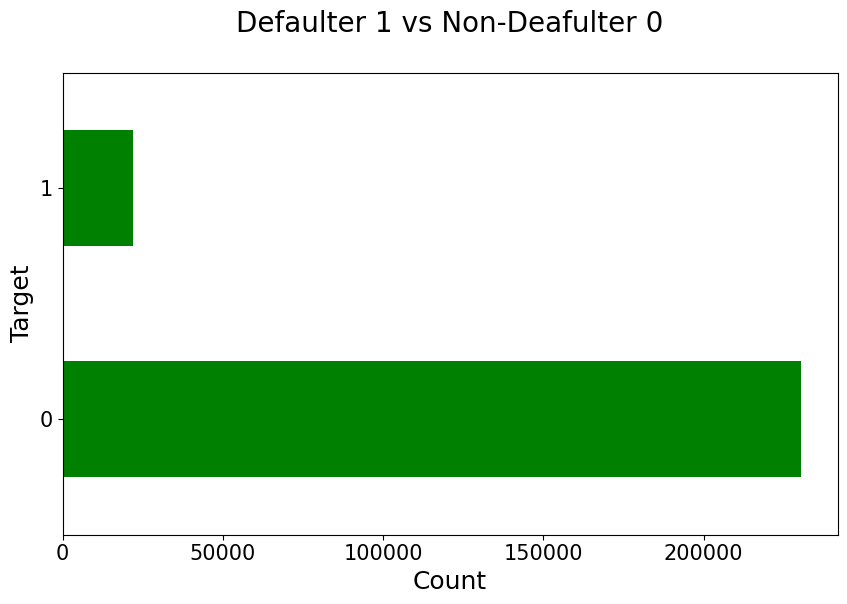

In [63]:
# Plotting for the TARGET variable

plt.figure(figsize=[10,6])
curr_app.TARGET.value_counts().plot.barh(color='Green')

plt.title('Defaulter 1 vs Non-Deafulter 0\n', fontsize=20)
plt.xlabel('Count', fontsize=18)
plt.ylabel('Target', fontsize=18)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.show()

In [64]:
# Checking the Imbalance ratio for the TARGET column

target_0 = curr_app.loc[curr_app['TARGET']==0]
target_1 = curr_app.loc[curr_app['TARGET']==1]

round(len(target_0)/len(target_1),2)

10.55

# Univariate Analysis

## Finding Outliers for target_0

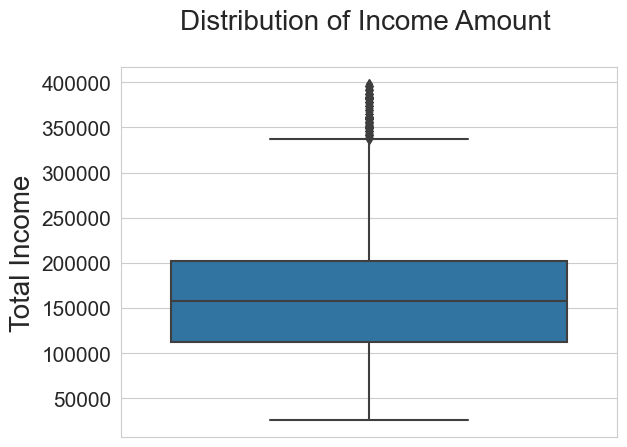

In [65]:
# Distribution of Income Amount:

sns.set_style('whitegrid')
filtered_data = target_0[target_0['AMT_INCOME_TOTAL'] < 400000]
sns.boxplot(data=filtered_data, y='AMT_INCOME_TOTAL')

plt.yticks(fontsize=15)
plt.ylabel('Total Income', fontsize=20)
plt.title('Distribution of Income Amount \n', fontsize=20)
plt.show()

### Conclusion: Most of the Clients lies within 3.5 lakh Income range "Middle Income Class" - Within Upper IQR Range. Outliers are definetly present but  they are also among the potential target therefore we have to keep their account.

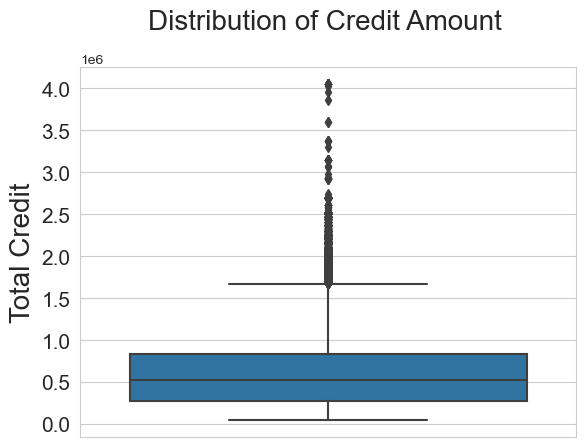

In [66]:
# Distribution of Credit Amount:

sns.set_style('whitegrid')

sns.boxplot(data=target_0, y='AMT_CREDIT')

plt.yticks(fontsize=15)
plt.ylabel('Total Credit', fontsize=20)
plt.title('Distribution of Credit Amount \n', fontsize=20)
plt.show()

### Conclusion: There are Outliers present but majority of Clients lies under the credit amount of 15 lakhs which is the upper IQR. Therefore the loan amount less than 15 lakh should be the target category.

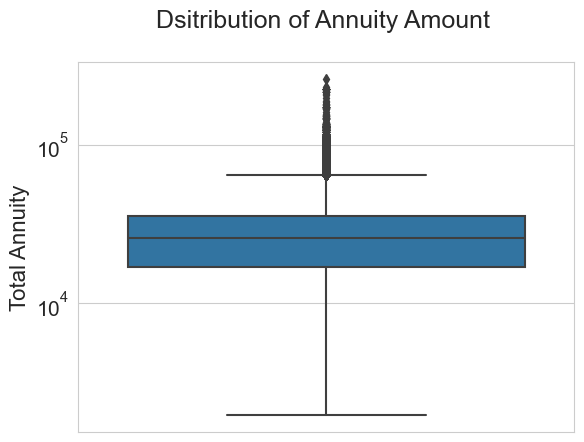

In [67]:
# Distribution of Annuity:

sns.set_style('whitegrid')

sns.boxplot(data=target_0, y='AMT_ANNUITY')
plt.yscale('log')
plt.yticks(fontsize=15)
plt.ylabel('Total Annuity', fontsize=16)
plt.title('Dsitribution of Annuity Amount \n', fontsize=18)
plt.show()

## Finding Outliers for target_1

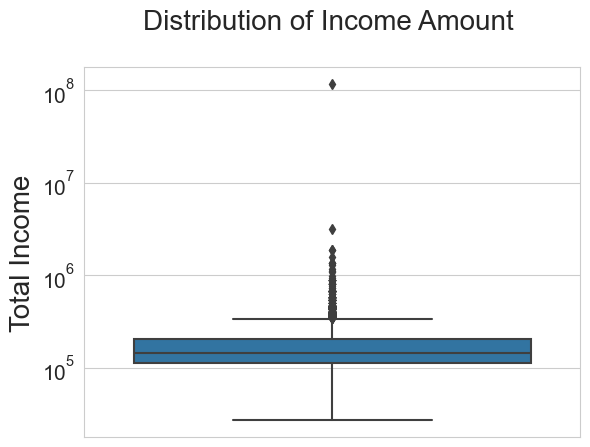

In [68]:
# Distribution of Income Amount:

sns.set_style('whitegrid')
sns.boxplot(data=target_1, y='AMT_INCOME_TOTAL')
plt.yscale('log')
plt.yticks(fontsize=15)
plt.ylabel('Total Income', fontsize=20)
plt.title('Distribution of Income Amount \n', fontsize=20)
plt.show()

### Conclusion: Significant amount of Outliers are present and most of the Income of client lies within the third quartile

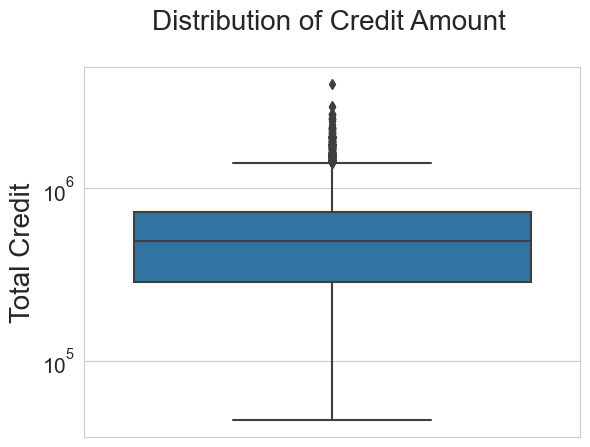

In [69]:
# Distribution of Credit Amount:

sns.set_style('whitegrid')

sns.boxplot(data=target_1, y='AMT_CREDIT')
plt.yscale('log')
plt.yticks(fontsize=15)
plt.ylabel('Total Credit', fontsize=20)
plt.title('Distribution of Credit Amount \n', fontsize=20)
plt.show()

### Conclusion: Most of the clients lies in the first quartile and there seems outliers in the dataset

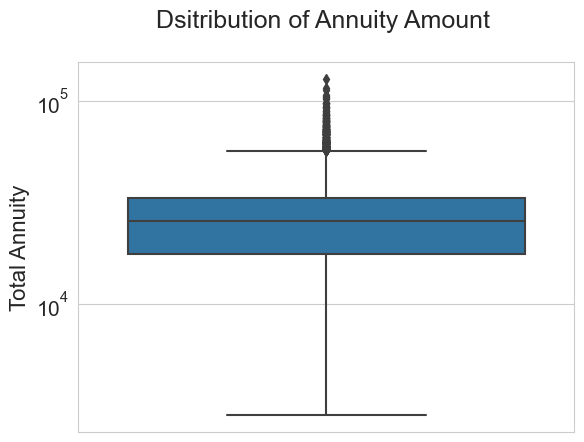

In [70]:
# Distribution of Annuity:

sns.set_style('whitegrid')

sns.boxplot(data=target_1, y='AMT_ANNUITY')
plt.yscale('log')
plt.yticks(fontsize=15)
plt.ylabel('Total Annuity', fontsize=16)
plt.title('Dsitribution of Annuity Amount \n', fontsize=18)
plt.show()

### Conclusion: First quartile is bigger that means most of the customers lies within the first quartile. Some outliers are present

## Plotting a bar chart for Target = 0 people (Non-Defaulter)!!

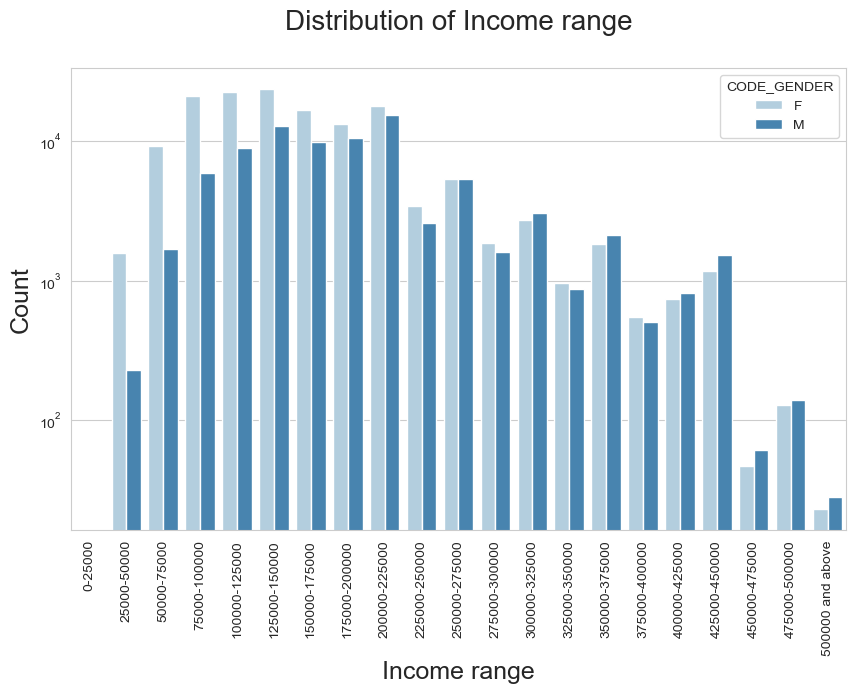

In [71]:
# Plotting for Income Range across various Gender

plt.figure(figsize=[10,6])
sns.set_style('whitegrid')

sns.countplot(data=target_0, x='AMT_INCOME_RANGE', hue='CODE_GENDER', palette= 'Blues')

plt.xticks(rotation=90)
plt.title('Distribution of Income range\n', fontsize=20)
plt.xlabel('Income range', fontsize=18)
plt.ylabel('Count', fontsize=18)
plt.yscale('log')
plt.show()

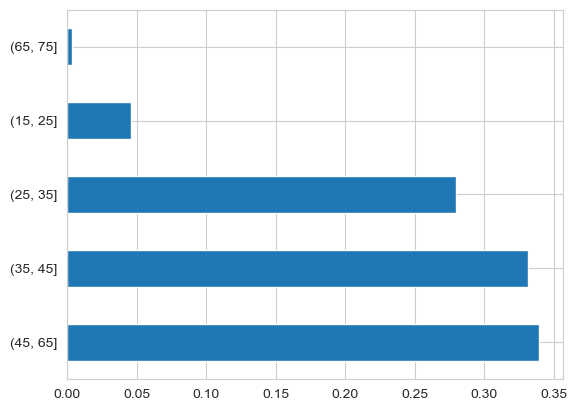

In [72]:
# Plotting for Age Groups

target_0['AGE_GROUP'].value_counts(normalize=True).plot.barh()
plt.show()

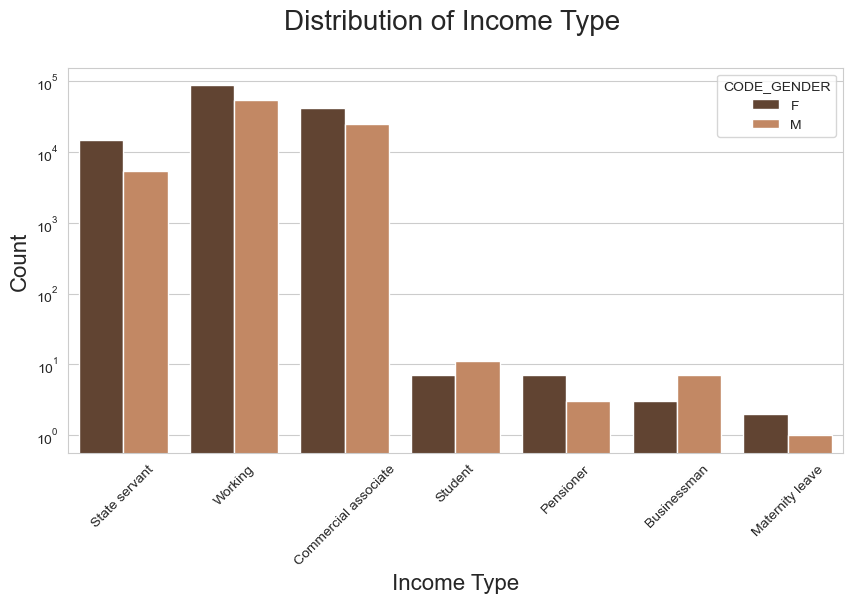

In [73]:
# Plotting for the Various Income Types across various Gender

plt.figure(figsize=(10,5))
sns.set_style('whitegrid')

sns.countplot(data=target_0, x='NAME_INCOME_TYPE', hue='CODE_GENDER', palette='copper')

plt.xticks(rotation=45)
plt.title('Distribution of Income Type \n', fontsize=20)
plt.xlabel('Income Type', fontsize=16)
plt.ylabel('Count', fontsize=16)
plt.yscale('log')
plt.show()

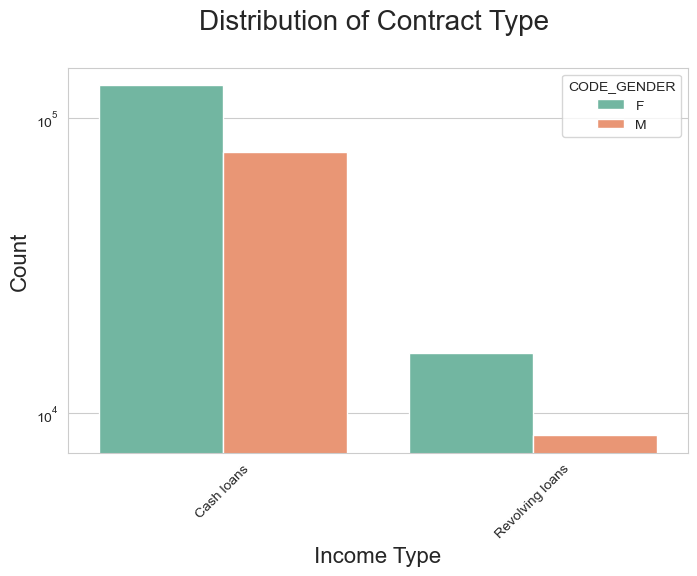

In [74]:
# Plotting for the Contract Type across various Genders!!

plt.figure(figsize=(8,5))
sns.set_style('whitegrid')

sns.countplot(data=target_0, x='NAME_CONTRACT_TYPE', hue='CODE_GENDER', palette='Set2')

plt.xticks(rotation=45)
plt.title('Distribution of Contract Type \n', fontsize=20)
plt.xlabel('Income Type', fontsize=16)
plt.ylabel('Count', fontsize=16)
plt.yscale('log')
plt.show()

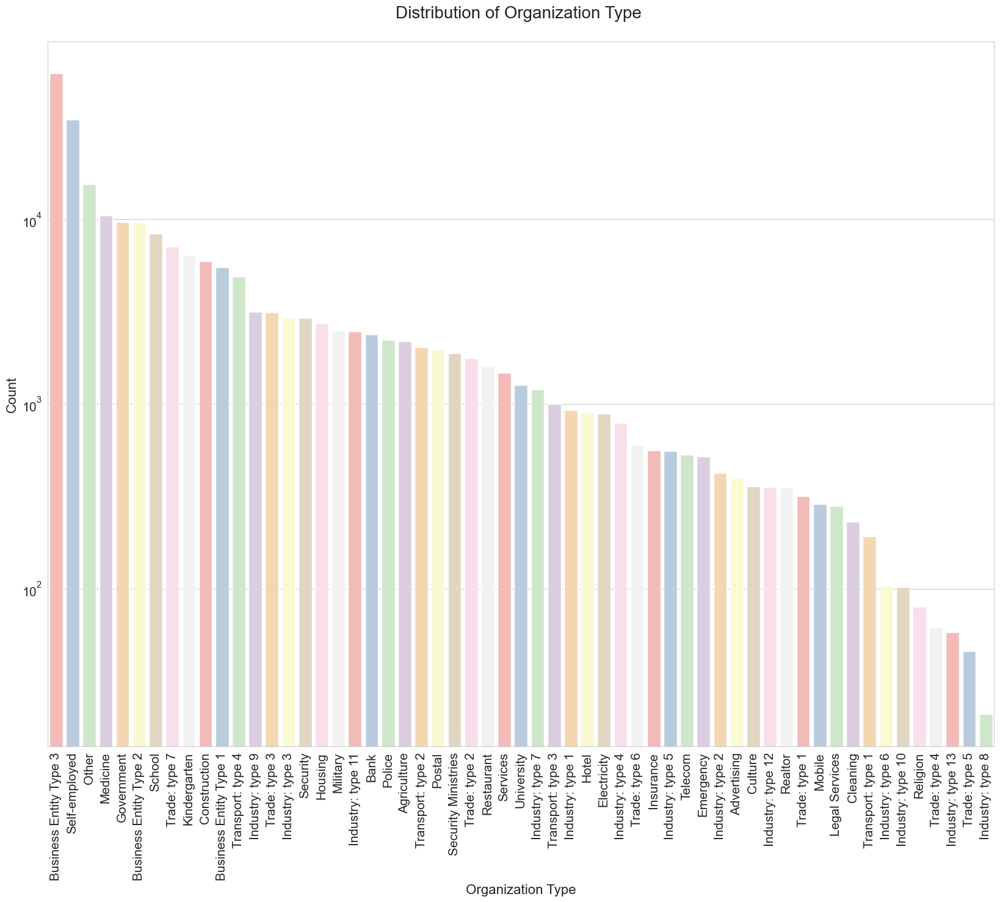

In [75]:
# Plotting for the various Organization Types

plt.figure(figsize=(20,15))

sns.countplot(data=target_0, x='ORGANIZATION_TYPE', order=target_0['ORGANIZATION_TYPE'].value_counts().index, palette='Pastel1')

plt.title('Distribution of Organization Type \n', fontsize=20)
plt.xticks(rotation=90, fontsize=15)
plt.yticks(fontsize=15)
plt.yscale('log')
plt.xlabel('Organization Type', fontsize=16)
plt.ylabel('Count', fontsize=16)

plt.show()

# Univariate Analysis for target_1

## Plotting a bar chart for Target = 1 people (Defaulter)!!

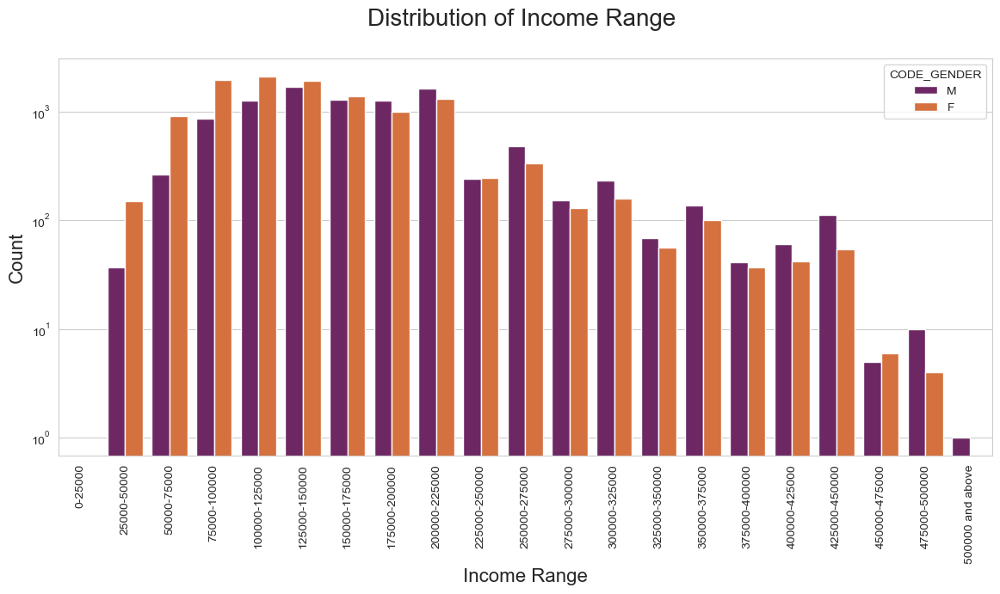

In [76]:
# Plotting for Income range across various Gender

plt.figure(figsize=(14,6))
sns.set_style('whitegrid')

sns.countplot(data=target_1, x='AMT_INCOME_RANGE', hue='CODE_GENDER', palette='inferno')

plt.xticks(rotation=90)
plt.title('Distribution of Income Range \n', fontsize=20)
plt.xlabel('Income Range', fontsize=16)
plt.ylabel('Count', fontsize=16)
plt.yscale('log')
plt.show()

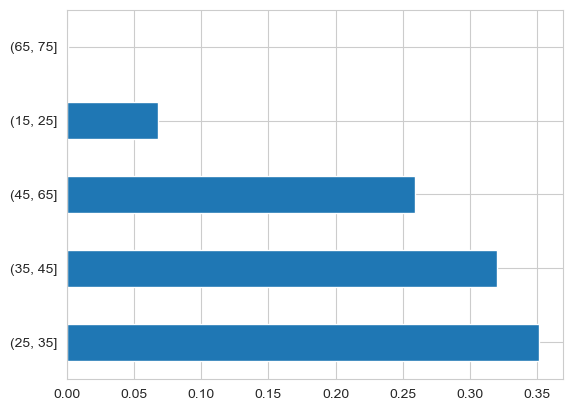

In [77]:
# Plotting for Age groups in target 1:

target_1['AGE_GROUP'].value_counts(normalize=True).plot.barh()
plt.show()

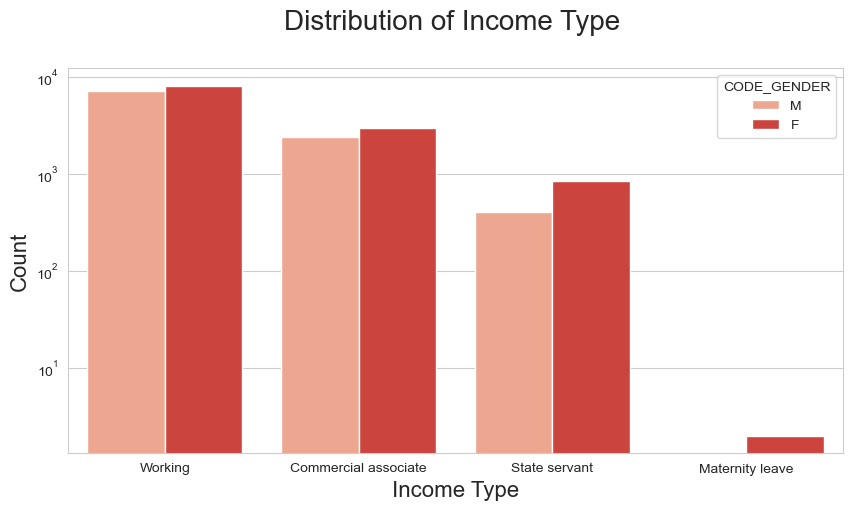

In [78]:
# Plotting for the various Income Types across Gender

plt.figure(figsize=(10,5))
sns.set_style('whitegrid')

sns.countplot(data=target_1, x='NAME_INCOME_TYPE', hue='CODE_GENDER', palette='Reds')

plt.title('Distribution of Income Type \n', fontsize=20)
plt.xlabel('Income Type', fontsize=16)
plt.ylabel('Count', fontsize=16)
plt.yscale('log')
plt.show()

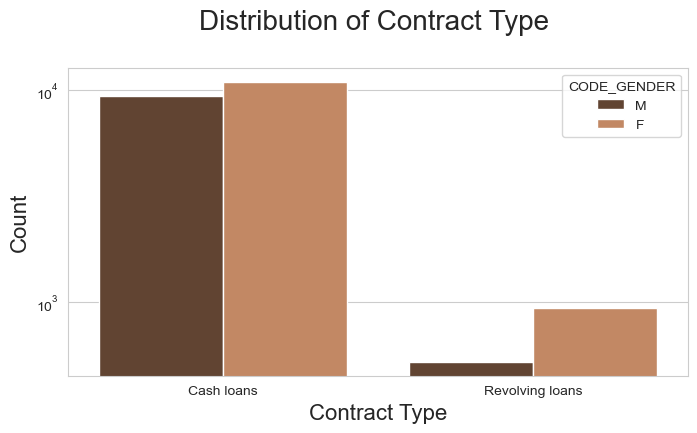

In [79]:
# Plotting for the Contract Type across Gender!!

plt.figure(figsize=(8,4))
sns.set_style('whitegrid')

sns.countplot(data=target_1, x='NAME_CONTRACT_TYPE', hue='CODE_GENDER', palette='copper')

plt.title('Distribution of Contract Type \n', fontsize=20)
plt.xlabel('Contract Type', fontsize=16)
plt.ylabel('Count', fontsize=16)
plt.yscale('log')
plt.show()

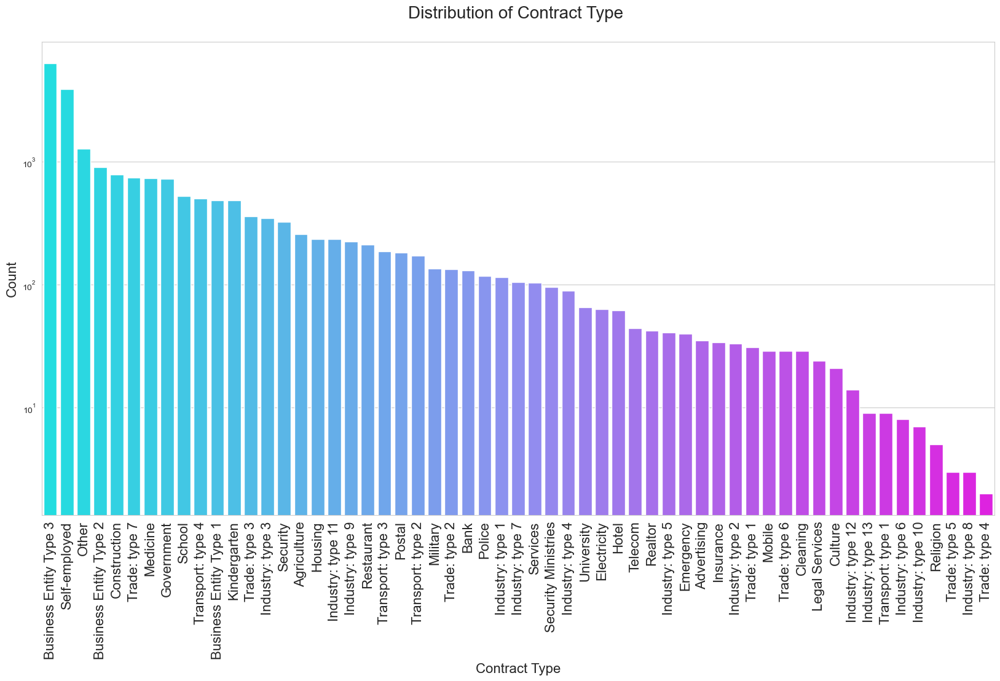

In [80]:
# Plotting for various Organization Types

plt.figure(figsize=(20,10))
sns.set_style('whitegrid')

sns.countplot(data=target_1, x='ORGANIZATION_TYPE', order=target_1['ORGANIZATION_TYPE'].value_counts().index, palette='cool')

plt.title('Distribution of Contract Type \n', fontsize=20)
plt.xticks(rotation=90, fontsize=16)
plt.xlabel('Contract Type', fontsize=16)
plt.ylabel('Count', fontsize=16)
plt.yscale('log')
plt.show()

# Defining the Correlation

In [81]:
# Calculating the Correlation among the target_0 people

target_0_corr = target_0.iloc[0:, 2:].corr()
target_0_corr

,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,AGE_IN_YEARS,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
CNT_CHILDREN,1.000000,-0.009826,-0.018704,-0.007612,-0.022360,-0.030352,-0.242414,0.063036,0.162900,-0.117746,0.893276,0.037475,0.037034,-0.033031,0.019388,0.003419,0.019062,0.002384,-0.002411,-0.001019,0.000660,0.000047,-0.017476,-0.000453,-0.020784
AMT_INCOME_TOTAL,-0.009826,1.000000,0.326155,0.400752,0.333385,0.169306,0.045574,-0.030102,0.034508,-0.026462,-0.003133,-0.184258,-0.198469,0.055934,-0.030661,-0.027914,-0.030477,-0.027415,-0.034048,0.002664,0.009039,0.009068,0.054560,0.016234,0.038459
AMT_CREDIT,-0.018704,0.326155,1.000000,0.762103,0.986402,0.103876,0.152579,-0.087500,-0.015180,-0.034914,0.036760,-0.106691,-0.115342,0.040390,-0.003803,-0.022223,-0.003770,-0.024255,-0.069837,-0.002694,0.006213,0.000279,0.054174,0.022967,-0.027913
AMT_ANNUITY,-0.007612,0.400752,0.762103,1.000000,0.766962,0.122206,0.091473,-0.052470,0.009814,-0.025990,0.041231,-0.132336,-0.145517,0.034038,-0.016426,-0.023286,-0.016241,-0.024129,-0.060872,0.003876,0.003148,0.013904,0.033052,0.014217,-0.001546
AMT_GOODS_PRICE,-0.022360,0.333385,0.986402,0.766962,1.000000,0.107116,0.147091,-0.088602,-0.011845,-0.036697,0.034854,-0.107540,-0.115566,0.049736,-0.003854,-0.023390,-0.003865,-0.025052,-0.071831,-0.002229,0.006641,0.000888,0.055954,0.023408,-0.030343
REGION_POPULATION_RELATIVE,-0.030352,0.169306,0.103876,0.122206,0.107116,1.000000,0.041231,0.008663,-0.059696,-0.004014,-0.028813,-0.543381,-0.540836,0.174754,-0.013763,0.005047,-0.013241,0.000658,-0.043368,-0.001447,0.001957,-0.003770,0.074797,-0.002376,-0.003650
AGE_IN_YEARS,-0.242414,0.045574,0.152579,0.091473,0.147091,0.041231,1.000000,-0.352447,-0.298835,-0.107400,-0.178048,-0.036930,-0.036941,-0.048503,-0.019522,-0.015196,-0.019118,-0.015868,-0.136519,0.000231,-0.001099,0.003677,0.033922,0.008769,0.069034
DAYS_EMPLOYED,0.063036,-0.030102,-0.087500,-0.052470,-0.088602,0.008663,-0.352447,1.000000,0.172102,0.086679,0.031523,-0.017395,-0.015804,0.022200,-0.000752,0.007447,-0.000811,0.009392,0.135750,-0.003171,0.000872,-0.001395,-0.029415,-0.002094,-0.024442
DAYS_REGISTRATION,0.162900,0.034508,-0.015180,0.009814,-0.011845,-0.059696,-0.298835,0.172102,1.000000,0.029895,0.155681,0.094100,0.086657,-0.031501,0.016317,0.007925,0.016130,0.008158,0.072106,-0.002818,0.000637,-0.000589,-0.020348,0.002215,-0.018025
DAYS_ID_PUBLISH,-0.117746,-0.026462,-0.034914,-0.025990,-0.036697,-0.004014,-0.107400,0.086679,0.029895,1.000000,-0.109789,0.003617,0.001310,0.005436,-0.008769,0.008669,-0.009280,0.010258,0.104171,0.001470,-0.003028,-0.009028,-0.030810,-0.014189,-0.056114


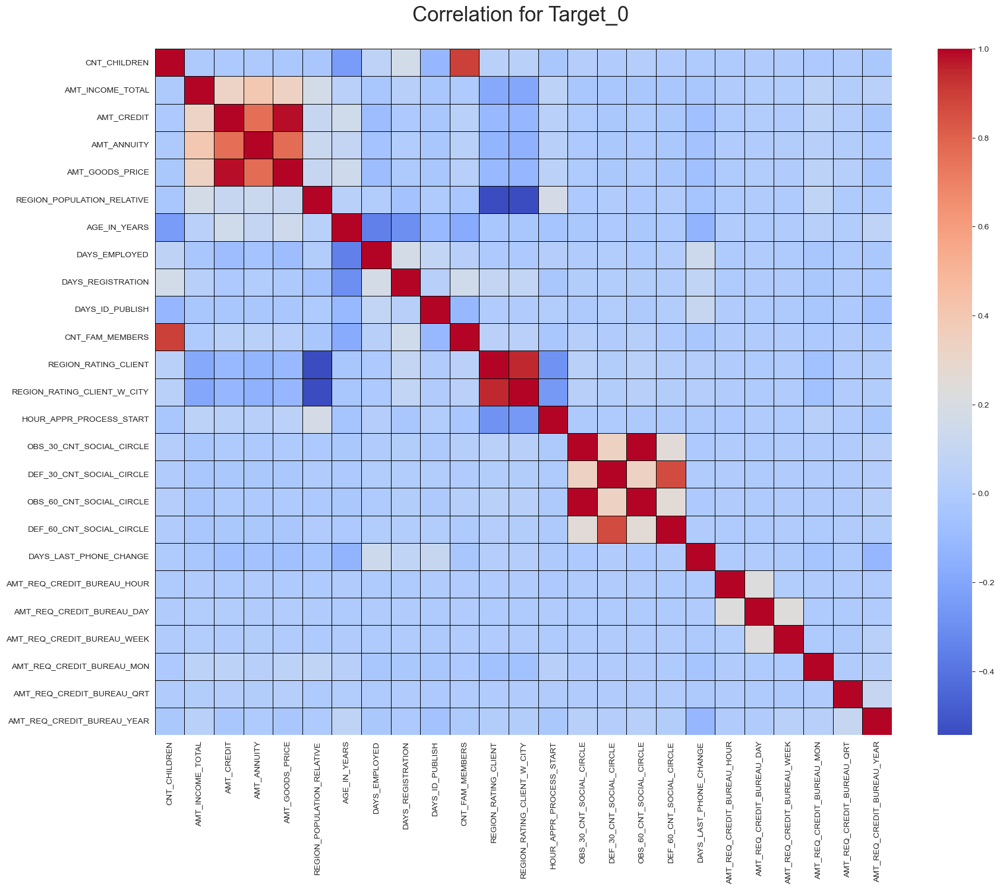

In [82]:
# Plotting the correlation for the target_0

plt.figure(figsize=(20,15))
sns.heatmap(target_0_corr, annot=False,cmap='coolwarm', linewidths=0.5, linecolor='black')
plt.title('Correlation for Target_0 \n', fontsize=25)
plt.show()

In [83]:
# Calculating correlation among Target 1 people

target_1_corr = target_1.iloc[0:, 2:].corr()
target_1_corr

,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,AGE_IN_YEARS,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
CNT_CHILDREN,1.000000,0.001872,-0.002074,0.015653,-0.007716,-0.032019,-0.176659,0.032627,0.126411,-0.089861,0.893829,0.046712,0.048951,-0.038923,0.028712,0.002959,0.027955,-0.003220,0.011577,-0.001269,-0.008695,-0.006195,-0.015163,-0.011841,-0.015698
AMT_INCOME_TOTAL,0.001872,1.000000,0.036484,0.043358,0.036162,0.008476,0.007754,-0.000039,-0.003959,-0.008858,0.003692,-0.021128,-0.022355,0.012520,-0.005866,-0.005849,-0.005765,-0.005282,-0.001184,0.000925,-0.000071,0.000885,0.005141,0.000607,0.005657
AMT_CREDIT,-0.002074,0.036484,1.000000,0.748708,0.982536,0.069220,0.189256,-0.106003,-0.033250,-0.062405,0.045420,-0.061324,-0.074459,0.029054,0.015835,-0.031869,0.016319,-0.035170,-0.115908,-0.005051,-0.000943,0.013307,0.061456,-0.003275,-0.008383
AMT_ANNUITY,0.015653,0.043358,0.748708,1.000000,0.749591,0.074406,0.090169,-0.049032,0.014302,-0.044289,0.054884,-0.075560,-0.092358,0.022524,-0.000018,-0.024644,0.001216,-0.027918,-0.083159,0.010425,-0.001406,0.034566,0.051267,-0.002792,-0.003192
AMT_GOODS_PRICE,-0.007716,0.036162,0.982536,0.749591,1.000000,0.076587,0.184871,-0.111663,-0.031895,-0.064755,0.042077,-0.069277,-0.081046,0.042079,0.016511,-0.027380,0.017177,-0.029957,-0.122927,-0.004080,0.000854,0.015326,0.064955,-0.002217,-0.010954
REGION_POPULATION_RELATIVE,-0.032019,0.008476,0.069220,0.074406,0.076587,1.000000,0.049666,-0.015758,-0.055746,-0.011965,-0.030847,-0.443159,-0.447083,0.144049,0.004513,0.023877,0.004907,0.015341,-0.054281,0.000885,-0.001070,0.007411,0.067029,-0.002863,0.004887
AGE_IN_YEARS,-0.176659,0.007754,0.189256,0.090169,0.184871,0.049666,1.000000,-0.306724,-0.241118,-0.134694,-0.110464,-0.049111,-0.048320,-0.035042,0.009152,-0.011419,0.009732,-0.012926,-0.147112,-0.010060,-0.000378,0.001425,0.032806,0.019177,0.093153
DAYS_EMPLOYED,0.032627,-0.000039,-0.106003,-0.049032,-0.111663,-0.015758,-0.306724,1.000000,0.137454,0.096559,-0.001630,0.006873,0.003773,0.000092,-0.030834,0.000503,-0.030778,0.000288,0.169963,0.007059,-0.007546,-0.012194,-0.028851,0.007965,-0.044658
DAYS_REGISTRATION,0.126411,-0.003959,-0.033250,0.014302,-0.031895,-0.055746,-0.241118,0.137454,1.000000,0.049891,0.123583,0.111576,0.106419,-0.048209,0.014861,0.014170,0.015193,0.012064,0.087973,-0.003311,0.000184,0.006521,-0.001332,-0.009887,-0.018053
DAYS_ID_PUBLISH,-0.089861,-0.008858,-0.062405,-0.044289,-0.064755,-0.011965,-0.134694,0.096559,0.049891,1.000000,-0.088621,0.004788,0.001434,0.008774,-0.020269,0.012605,-0.020052,0.009585,0.134239,0.000149,-0.015244,-0.003879,-0.032077,-0.004953,-0.073064


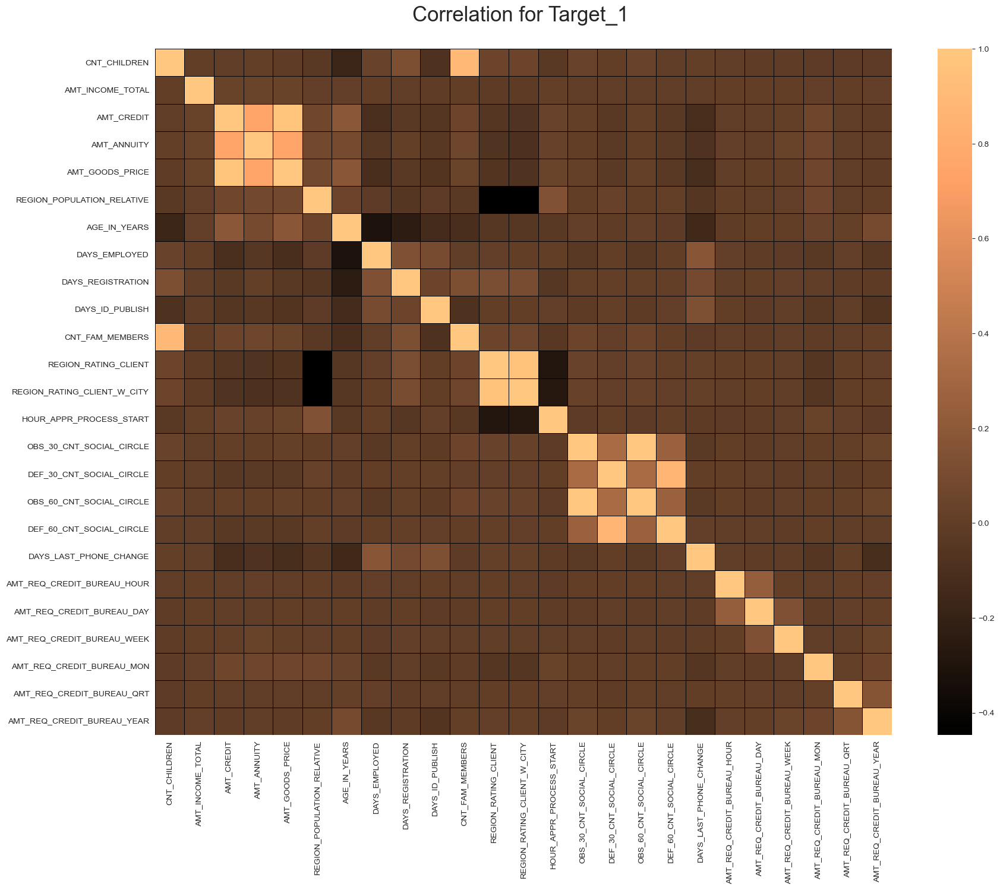

In [84]:
# Plotting the correlation heatmap for Target_1!!

plt.figure(figsize=(20,15))
sns.heatmap(target_1_corr, annot=False, cmap='copper', linewidths=0.5, linecolor='black')
plt.title('Correlation for Target_1 \n', fontsize=25)
plt.show()

# Finding the top 10 correlations for target_0 and Target_1

In [85]:
# Finding corr for target_0

target_0_corr = target_0.iloc[0:, 2:].corr()
target_0_corr

,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,AGE_IN_YEARS,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
CNT_CHILDREN,1.000000,-0.009826,-0.018704,-0.007612,-0.022360,-0.030352,-0.242414,0.063036,0.162900,-0.117746,0.893276,0.037475,0.037034,-0.033031,0.019388,0.003419,0.019062,0.002384,-0.002411,-0.001019,0.000660,0.000047,-0.017476,-0.000453,-0.020784
AMT_INCOME_TOTAL,-0.009826,1.000000,0.326155,0.400752,0.333385,0.169306,0.045574,-0.030102,0.034508,-0.026462,-0.003133,-0.184258,-0.198469,0.055934,-0.030661,-0.027914,-0.030477,-0.027415,-0.034048,0.002664,0.009039,0.009068,0.054560,0.016234,0.038459
AMT_CREDIT,-0.018704,0.326155,1.000000,0.762103,0.986402,0.103876,0.152579,-0.087500,-0.015180,-0.034914,0.036760,-0.106691,-0.115342,0.040390,-0.003803,-0.022223,-0.003770,-0.024255,-0.069837,-0.002694,0.006213,0.000279,0.054174,0.022967,-0.027913
AMT_ANNUITY,-0.007612,0.400752,0.762103,1.000000,0.766962,0.122206,0.091473,-0.052470,0.009814,-0.025990,0.041231,-0.132336,-0.145517,0.034038,-0.016426,-0.023286,-0.016241,-0.024129,-0.060872,0.003876,0.003148,0.013904,0.033052,0.014217,-0.001546
AMT_GOODS_PRICE,-0.022360,0.333385,0.986402,0.766962,1.000000,0.107116,0.147091,-0.088602,-0.011845,-0.036697,0.034854,-0.107540,-0.115566,0.049736,-0.003854,-0.023390,-0.003865,-0.025052,-0.071831,-0.002229,0.006641,0.000888,0.055954,0.023408,-0.030343
REGION_POPULATION_RELATIVE,-0.030352,0.169306,0.103876,0.122206,0.107116,1.000000,0.041231,0.008663,-0.059696,-0.004014,-0.028813,-0.543381,-0.540836,0.174754,-0.013763,0.005047,-0.013241,0.000658,-0.043368,-0.001447,0.001957,-0.003770,0.074797,-0.002376,-0.003650
AGE_IN_YEARS,-0.242414,0.045574,0.152579,0.091473,0.147091,0.041231,1.000000,-0.352447,-0.298835,-0.107400,-0.178048,-0.036930,-0.036941,-0.048503,-0.019522,-0.015196,-0.019118,-0.015868,-0.136519,0.000231,-0.001099,0.003677,0.033922,0.008769,0.069034
DAYS_EMPLOYED,0.063036,-0.030102,-0.087500,-0.052470,-0.088602,0.008663,-0.352447,1.000000,0.172102,0.086679,0.031523,-0.017395,-0.015804,0.022200,-0.000752,0.007447,-0.000811,0.009392,0.135750,-0.003171,0.000872,-0.001395,-0.029415,-0.002094,-0.024442
DAYS_REGISTRATION,0.162900,0.034508,-0.015180,0.009814,-0.011845,-0.059696,-0.298835,0.172102,1.000000,0.029895,0.155681,0.094100,0.086657,-0.031501,0.016317,0.007925,0.016130,0.008158,0.072106,-0.002818,0.000637,-0.000589,-0.020348,0.002215,-0.018025
DAYS_ID_PUBLISH,-0.117746,-0.026462,-0.034914,-0.025990,-0.036697,-0.004014,-0.107400,0.086679,0.029895,1.000000,-0.109789,0.003617,0.001310,0.005436,-0.008769,0.008669,-0.009280,0.010258,0.104171,0.001470,-0.003028,-0.009028,-0.030810,-0.014189,-0.056114


In [86]:
# Tranforming the negative values to positive and sorting them:
# 'corr_0' is a sorted Series of absolute correlation values, excluding NaNs

corr_0 = target_0_corr.abs().unstack().sort_values(kind='quicksort').dropna()
corr_0 = corr_0[corr_0 !=1.0]
corr_0

CNT_FAM_MEMBERS              AMT_REQ_CREDIT_BUREAU_DAY      0.000022
AMT_REQ_CREDIT_BUREAU_DAY    CNT_FAM_MEMBERS                0.000022
AMT_REQ_CREDIT_BUREAU_WEEK   CNT_CHILDREN                   0.000047
CNT_CHILDREN                 AMT_REQ_CREDIT_BUREAU_WEEK     0.000047
OBS_60_CNT_SOCIAL_CIRCLE     AMT_REQ_CREDIT_BUREAU_HOUR     0.000071
AMT_REQ_CREDIT_BUREAU_HOUR   OBS_60_CNT_SOCIAL_CIRCLE       0.000071
DAYS_LAST_PHONE_CHANGE       DEF_30_CNT_SOCIAL_CIRCLE       0.000073
DEF_30_CNT_SOCIAL_CIRCLE     DAYS_LAST_PHONE_CHANGE         0.000073
AMT_REQ_CREDIT_BUREAU_WEEK   DEF_60_CNT_SOCIAL_CIRCLE       0.000095
DEF_60_CNT_SOCIAL_CIRCLE     AMT_REQ_CREDIT_BUREAU_WEEK     0.000095
AMT_REQ_CREDIT_BUREAU_HOUR   OBS_30_CNT_SOCIAL_CIRCLE       0.000204
OBS_30_CNT_SOCIAL_CIRCLE     AMT_REQ_CREDIT_BUREAU_HOUR     0.000204
AMT_REQ_CREDIT_BUREAU_WEEK   DEF_30_CNT_SOCIAL_CIRCLE       0.000210
DEF_30_CNT_SOCIAL_CIRCLE     AMT_REQ_CREDIT_BUREAU_WEEK     0.000210
AMT_REQ_CREDIT_BUREAU_HOUR   AGE_I

### Extracting the Top 10 Correlation target_0

In [87]:
corr_0.tail(10)

DEF_30_CNT_SOCIAL_CIRCLE     DEF_60_CNT_SOCIAL_CIRCLE       0.861454
DEF_60_CNT_SOCIAL_CIRCLE     DEF_30_CNT_SOCIAL_CIRCLE       0.861454
CNT_FAM_MEMBERS              CNT_CHILDREN                   0.893276
CNT_CHILDREN                 CNT_FAM_MEMBERS                0.893276
REGION_RATING_CLIENT         REGION_RATING_CLIENT_W_CITY    0.949504
REGION_RATING_CLIENT_W_CITY  REGION_RATING_CLIENT           0.949504
AMT_CREDIT                   AMT_GOODS_PRICE                0.986402
AMT_GOODS_PRICE              AMT_CREDIT                     0.986402
OBS_60_CNT_SOCIAL_CIRCLE     OBS_30_CNT_SOCIAL_CIRCLE       0.998491
OBS_30_CNT_SOCIAL_CIRCLE     OBS_60_CNT_SOCIAL_CIRCLE       0.998491
dtype: float64

In [88]:
# Finding it for target_1

target_1_corr = target_1.iloc[0:, 2:].corr()
target_1_corr

,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,AGE_IN_YEARS,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
CNT_CHILDREN,1.000000,0.001872,-0.002074,0.015653,-0.007716,-0.032019,-0.176659,0.032627,0.126411,-0.089861,0.893829,0.046712,0.048951,-0.038923,0.028712,0.002959,0.027955,-0.003220,0.011577,-0.001269,-0.008695,-0.006195,-0.015163,-0.011841,-0.015698
AMT_INCOME_TOTAL,0.001872,1.000000,0.036484,0.043358,0.036162,0.008476,0.007754,-0.000039,-0.003959,-0.008858,0.003692,-0.021128,-0.022355,0.012520,-0.005866,-0.005849,-0.005765,-0.005282,-0.001184,0.000925,-0.000071,0.000885,0.005141,0.000607,0.005657
AMT_CREDIT,-0.002074,0.036484,1.000000,0.748708,0.982536,0.069220,0.189256,-0.106003,-0.033250,-0.062405,0.045420,-0.061324,-0.074459,0.029054,0.015835,-0.031869,0.016319,-0.035170,-0.115908,-0.005051,-0.000943,0.013307,0.061456,-0.003275,-0.008383
AMT_ANNUITY,0.015653,0.043358,0.748708,1.000000,0.749591,0.074406,0.090169,-0.049032,0.014302,-0.044289,0.054884,-0.075560,-0.092358,0.022524,-0.000018,-0.024644,0.001216,-0.027918,-0.083159,0.010425,-0.001406,0.034566,0.051267,-0.002792,-0.003192
AMT_GOODS_PRICE,-0.007716,0.036162,0.982536,0.749591,1.000000,0.076587,0.184871,-0.111663,-0.031895,-0.064755,0.042077,-0.069277,-0.081046,0.042079,0.016511,-0.027380,0.017177,-0.029957,-0.122927,-0.004080,0.000854,0.015326,0.064955,-0.002217,-0.010954
REGION_POPULATION_RELATIVE,-0.032019,0.008476,0.069220,0.074406,0.076587,1.000000,0.049666,-0.015758,-0.055746,-0.011965,-0.030847,-0.443159,-0.447083,0.144049,0.004513,0.023877,0.004907,0.015341,-0.054281,0.000885,-0.001070,0.007411,0.067029,-0.002863,0.004887
AGE_IN_YEARS,-0.176659,0.007754,0.189256,0.090169,0.184871,0.049666,1.000000,-0.306724,-0.241118,-0.134694,-0.110464,-0.049111,-0.048320,-0.035042,0.009152,-0.011419,0.009732,-0.012926,-0.147112,-0.010060,-0.000378,0.001425,0.032806,0.019177,0.093153
DAYS_EMPLOYED,0.032627,-0.000039,-0.106003,-0.049032,-0.111663,-0.015758,-0.306724,1.000000,0.137454,0.096559,-0.001630,0.006873,0.003773,0.000092,-0.030834,0.000503,-0.030778,0.000288,0.169963,0.007059,-0.007546,-0.012194,-0.028851,0.007965,-0.044658
DAYS_REGISTRATION,0.126411,-0.003959,-0.033250,0.014302,-0.031895,-0.055746,-0.241118,0.137454,1.000000,0.049891,0.123583,0.111576,0.106419,-0.048209,0.014861,0.014170,0.015193,0.012064,0.087973,-0.003311,0.000184,0.006521,-0.001332,-0.009887,-0.018053
DAYS_ID_PUBLISH,-0.089861,-0.008858,-0.062405,-0.044289,-0.064755,-0.011965,-0.134694,0.096559,0.049891,1.000000,-0.088621,0.004788,0.001434,0.008774,-0.020269,0.012605,-0.020052,0.009585,0.134239,0.000149,-0.015244,-0.003879,-0.032077,-0.004953,-0.073064


In [89]:
# Again converting negative to positives then sorting them:

corr_1 = target_1_corr.abs().unstack().sort_values(kind='quicksort').dropna()
corr_1 = corr_1[corr_1 !=1.0]
corr_1

OBS_30_CNT_SOCIAL_CIRCLE     AMT_ANNUITY                    0.000018
AMT_ANNUITY                  OBS_30_CNT_SOCIAL_CIRCLE       0.000018
AMT_INCOME_TOTAL             DAYS_EMPLOYED                  0.000039
DAYS_EMPLOYED                AMT_INCOME_TOTAL               0.000039
AMT_REQ_CREDIT_BUREAU_DAY    AMT_INCOME_TOTAL               0.000071
AMT_INCOME_TOTAL             AMT_REQ_CREDIT_BUREAU_DAY      0.000071
DAYS_EMPLOYED                HOUR_APPR_PROCESS_START        0.000092
HOUR_APPR_PROCESS_START      DAYS_EMPLOYED                  0.000092
REGION_RATING_CLIENT         AMT_REQ_CREDIT_BUREAU_HOUR     0.000138
AMT_REQ_CREDIT_BUREAU_HOUR   REGION_RATING_CLIENT           0.000138
                             DAYS_ID_PUBLISH                0.000149
DAYS_ID_PUBLISH              AMT_REQ_CREDIT_BUREAU_HOUR     0.000149
DAYS_REGISTRATION            AMT_REQ_CREDIT_BUREAU_DAY      0.000184
AMT_REQ_CREDIT_BUREAU_DAY    DAYS_REGISTRATION              0.000184
DEF_60_CNT_SOCIAL_CIRCLE     DAYS_

### Extracting the top 10 correlations in target_1

In [90]:
corr_1.tail(10)

DEF_60_CNT_SOCIAL_CIRCLE     DEF_30_CNT_SOCIAL_CIRCLE       0.867963
DEF_30_CNT_SOCIAL_CIRCLE     DEF_60_CNT_SOCIAL_CIRCLE       0.867963
CNT_FAM_MEMBERS              CNT_CHILDREN                   0.893829
CNT_CHILDREN                 CNT_FAM_MEMBERS                0.893829
REGION_RATING_CLIENT         REGION_RATING_CLIENT_W_CITY    0.956531
REGION_RATING_CLIENT_W_CITY  REGION_RATING_CLIENT           0.956531
AMT_CREDIT                   AMT_GOODS_PRICE                0.982536
AMT_GOODS_PRICE              AMT_CREDIT                     0.982536
OBS_30_CNT_SOCIAL_CIRCLE     OBS_60_CNT_SOCIAL_CIRCLE       0.998288
OBS_60_CNT_SOCIAL_CIRCLE     OBS_30_CNT_SOCIAL_CIRCLE       0.998288
dtype: float64

## Bivariate analysis of Numerical columns

## Plotting scatter plot to find and correlations to study any trends in the data_set!!

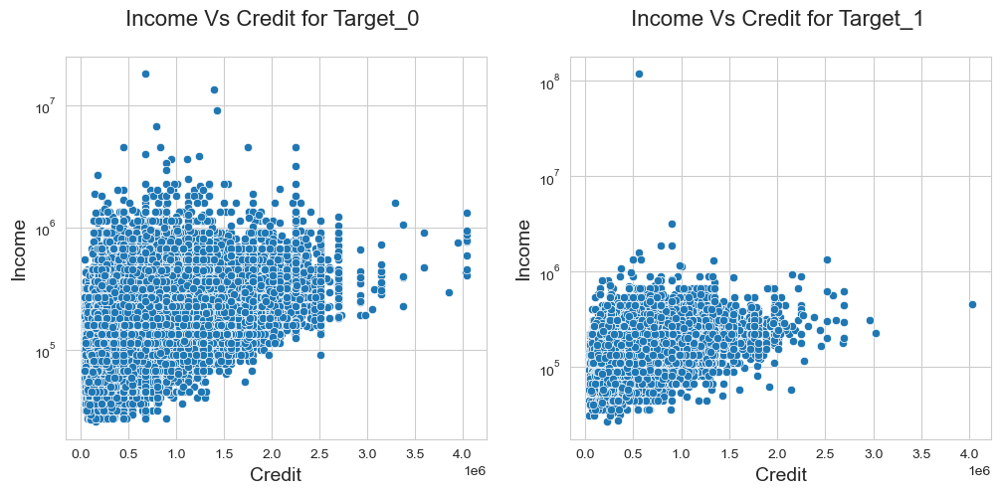

In [91]:
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
sns.scatterplot(x=target_0.AMT_CREDIT, y=target_0.AMT_INCOME_TOTAL)
plt.title('Income Vs Credit for Target_0 \n', fontsize=16)
plt.yscale('log')
plt.xlabel('Credit', fontsize=14)
plt.ylabel('Income', fontsize=14)

plt.subplot(1,2,2)
sns.scatterplot(x=target_1.AMT_CREDIT, y=target_1.AMT_INCOME_TOTAL)
plt.title('Income Vs Credit for Target_1 \n', fontsize=16)
plt.yscale('log')
plt.xlabel('Credit', fontsize=14)
plt.ylabel('Income', fontsize=14)

plt.show()

### Conclusion:
    1. Income and Credit has somewhat slightly negative correlation which is more prominant in the Target_1 
       people.
    2. Much of credit is acquired by people having Income ranges from 10^5 to 10^6 which constitutes 
       the Middle Income group.
    3. Very less credit requirement for Higher income group.
    4. Further most of the people who defaulted are also from this similar ranging group they constitutes most 
       of the credit but unable to repay.
    5. Therfore there is an ironical relationship in this segment as most of the people who defaulted and most
       of the potential customers lies in the same Income Segment.

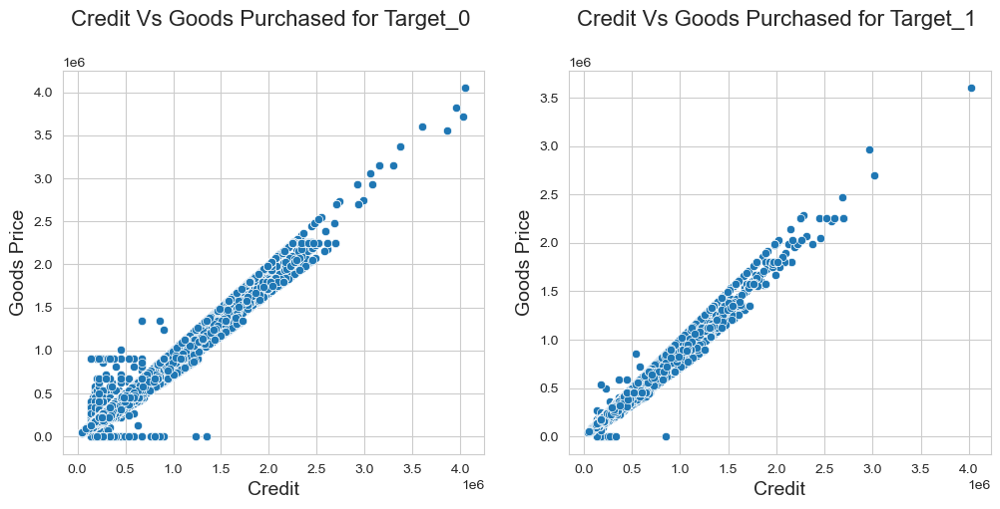

In [92]:
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
sns.scatterplot(x=target_0.AMT_CREDIT, y=target_0.AMT_GOODS_PRICE)
plt.title('Credit Vs Goods Purchased for Target_0 \n', fontsize=16)
plt.xlabel('Credit', fontsize=14)
plt.ylabel('Goods Price', fontsize=14)

plt.subplot(1,2,2)
sns.scatterplot(x=target_1.AMT_CREDIT, y=target_1.AMT_GOODS_PRICE)
plt.title('Credit Vs Goods Purchased for Target_1 \n', fontsize=16)
plt.xlabel('Credit', fontsize=14)
plt.ylabel('Goods Price', fontsize=14)

plt.show()

## Conclusion:
   - Credit and Goods price on contrary to above is highly correlated since higher credid
     is required for purchasing higher prized goods such as Car, Home Loan etc
   - Since Middle income group mostly relies on loan for much of their higher need, we assume this
     as the characterstic feature for this Income segement.

## Multivariate Analysis

### Target - 0

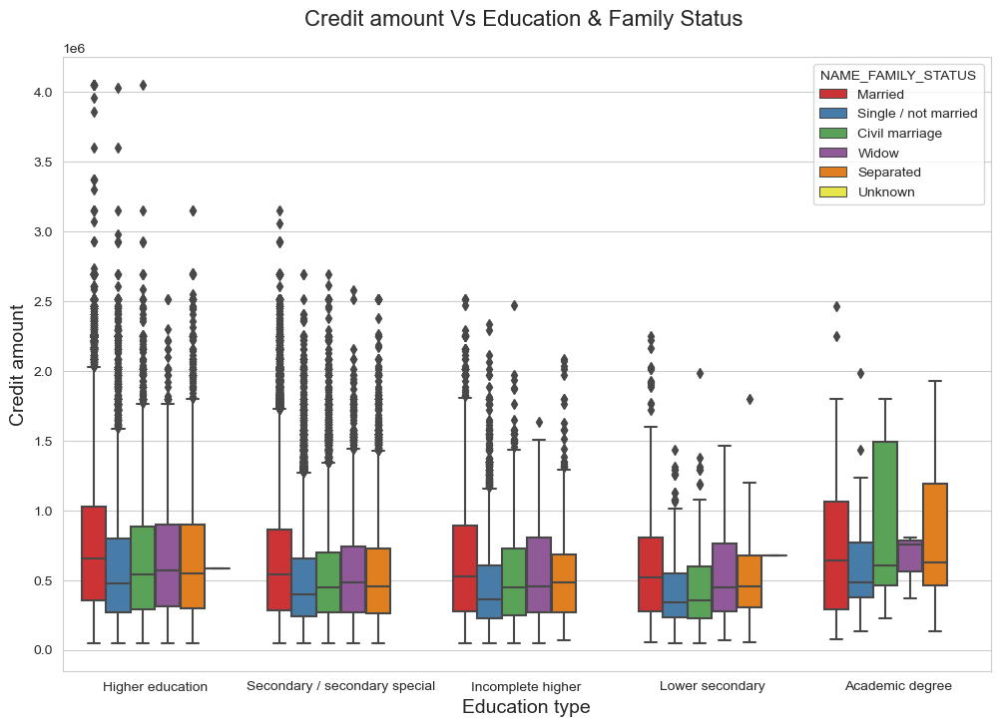

In [93]:
# Box plotting for the Target_0, Credit Amount

plt.figure(figsize=(12,8))

sns.boxplot( data=target_0, x='NAME_EDUCATION_TYPE', y='AMT_CREDIT', hue='NAME_FAMILY_STATUS', orient='v',palette= 'Set1')
plt.xticks(rotation=0)
plt.title('Credit amount Vs Education & Family Status \n', fontsize=16)
plt.xlabel('Education type', fontsize=14)
plt.ylabel('Credit amount', fontsize=14)

plt.show()

#### Conclusion: Among the 'Academic degree' education type people from 'Married','Civil marrige' and 'Seperated' are having higher number of credit than others.  Whereas 'Married' among all the education type have higher credit requirments among other type except in Acadmic degrees.

#### Higher Edu, Secondary Edu and Incomplete Higher are having most of the outliers which signifies that their credit requirment varies significantly. 

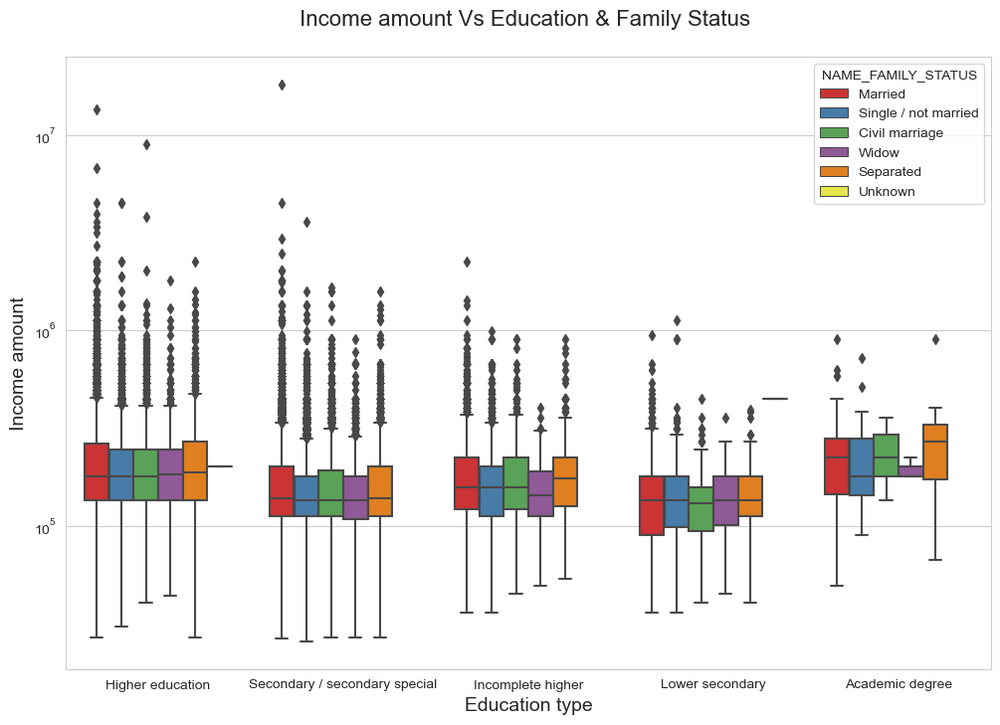

In [94]:
# Box plot for the Target = 0, Income Amount

plt.figure(figsize=(12,8))

sns.boxplot( data=target_0, x='NAME_EDUCATION_TYPE', y='AMT_INCOME_TOTAL', hue='NAME_FAMILY_STATUS', orient='v',palette= 'Set1')
plt.xticks(rotation=0)
plt.title('Income amount Vs Education & Family Status \n', fontsize=16)
plt.xlabel('Education type', fontsize=14)
plt.ylabel('Income amount', fontsize=14)
plt.yscale('log')
plt.show()

#### Conclusion: Higher Edu & Acedemic degree have similar income amount, whereas among the Higher Edu we see that almost all of the family status have similar Income.
#### Higher edu, Secondary special and Incomplete Higher have the highest number of Outliers. Clubing the above and this plot info we can safley assume that these three category vary significantly in Income scale as well their Credit needs.

### Target - 1

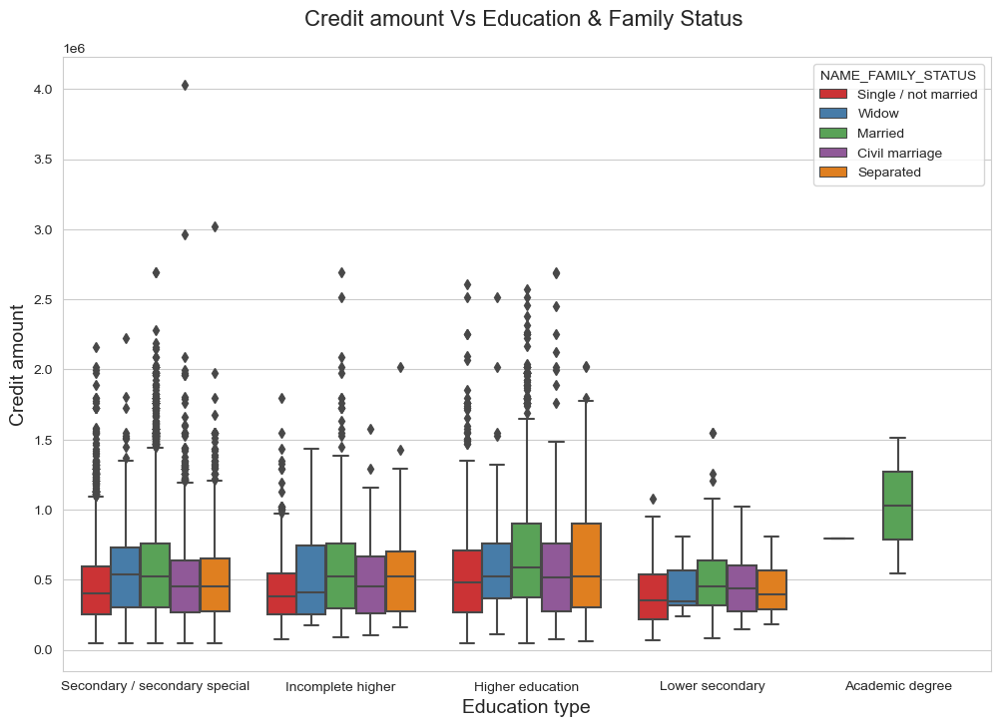

In [95]:
# Box Plotting for the Credit Amount (Target_1)

plt.figure(figsize=(12,8))

sns.boxplot( data=target_1, x='NAME_EDUCATION_TYPE', y='AMT_CREDIT', hue='NAME_FAMILY_STATUS', orient='v',palette= 'Set1')
plt.xticks(rotation=0)
plt.title('Credit amount Vs Education & Family Status \n', fontsize=16)
plt.xlabel('Education type', fontsize=14)
plt.ylabel('Credit amount', fontsize=14)

plt.show()

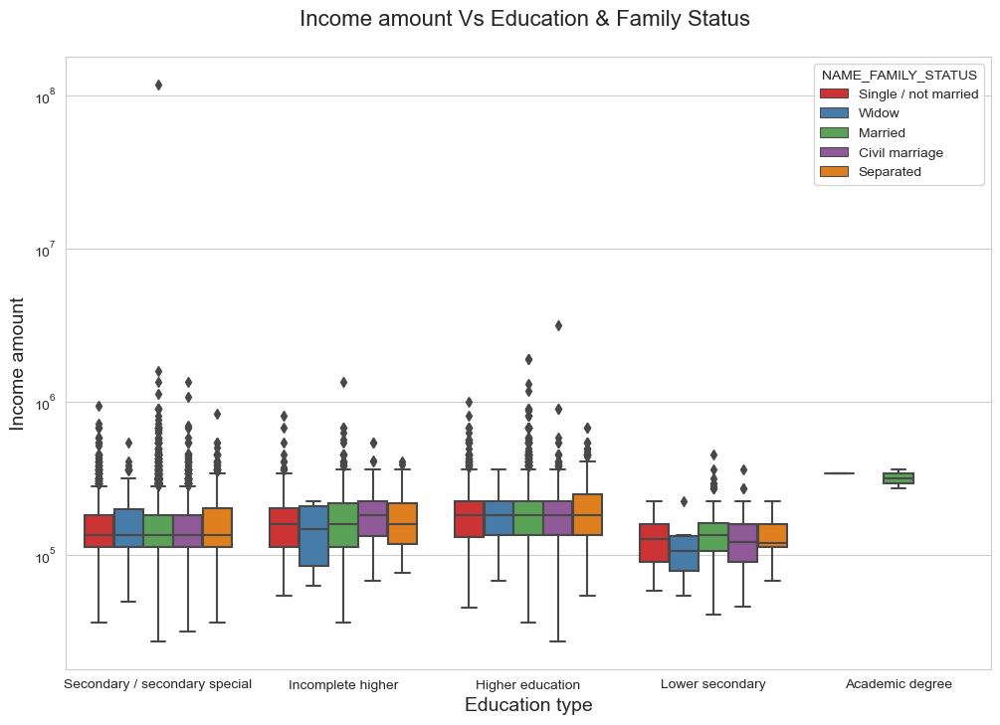

In [96]:
# Boxplot for Income Amount (Target_1)

plt.figure(figsize=(12,8))

sns.boxplot( data=target_1, x='NAME_EDUCATION_TYPE', y='AMT_INCOME_TOTAL', hue='NAME_FAMILY_STATUS', orient='v',palette= 'Set1')
plt.xticks(rotation=0)
plt.title('Income amount Vs Education & Family Status \n', fontsize=16)
plt.xlabel('Education type', fontsize=14)
plt.ylabel('Income amount', fontsize=14)
plt.yscale('log')
plt.show()

# Working on Previous_application_dataset

In [97]:
# Reading the dataset since we have already cleaned the dataset no further cleaning is required!!

prev_app.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_APPLICATION,AMT_CREDIT,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,NAME_YIELD_GROUP,PRODUCT_COMBINATION
0,2030495,271877,Consumer loans,17145.0,17145.0,SATURDAY,15,Y,1,XAP,Approved,-73,Cash through the bank,XAP,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,middle,POS mobile with interest
1,2802425,108129,Cash loans,607500.0,679671.0,THURSDAY,11,Y,1,XNA,Approved,-164,XNA,XAP,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,low_action,Cash X-Sell: low
2,2523466,122040,Cash loans,112500.0,136444.5,TUESDAY,11,Y,1,XNA,Approved,-301,Cash through the bank,XAP,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,high,Cash X-Sell: high
3,2819243,176158,Cash loans,450000.0,470790.0,MONDAY,7,Y,1,XNA,Approved,-512,Cash through the bank,XAP,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,middle,Cash X-Sell: middle
4,1784265,202054,Cash loans,337500.0,404055.0,THURSDAY,9,Y,1,Repairs,Refused,-781,Cash through the bank,HC,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,high,Cash Street: high


In [98]:
# Checking the NAME_CASH_LOAN_PURPOSE columns:

prev_app.NAME_CASH_LOAN_PURPOSE.value_counts()

XAP                                 922661
XNA                                 677918
Repairs                              23765
Other                                15608
Urgent needs                          8412
Buying a used car                     2888
Building a house or an annex          2693
Everyday expenses                     2416
Medicine                              2174
Payments on other loans               1931
Education                             1573
Journey                               1239
Purchase of electronic equipment      1061
Buying a new car                      1012
Wedding / gift / holiday               962
Buying a home                          865
Car repairs                            797
Furniture                              749
Buying a holiday home / land           533
Business development                   426
Gasification / water supply            300
Buying a garage                        136
Hobby                                   55
Money for a

In [99]:
# Dropping the unique values in dataset('XNA' & 'XAP'):

prev_app = prev_app.drop(prev_app[prev_app.NAME_CASH_LOAN_PURPOSE == 'XNA'].index)
prev_app = prev_app.drop(prev_app[prev_app.NAME_CASH_LOAN_PURPOSE == 'XAP'].index)

In [100]:
# Confirming the operation:

prev_app.NAME_CASH_LOAN_PURPOSE.value_counts()

Repairs                             23765
Other                               15608
Urgent needs                         8412
Buying a used car                    2888
Building a house or an annex         2693
Everyday expenses                    2416
Medicine                             2174
Payments on other loans              1931
Education                            1573
Journey                              1239
Purchase of electronic equipment     1061
Buying a new car                     1012
Wedding / gift / holiday              962
Buying a home                         865
Car repairs                           797
Furniture                             749
Buying a holiday home / land          533
Business development                  426
Gasification / water supply           300
Buying a garage                       136
Hobby                                  55
Money for a third person               25
Refusal to name the goal               15
Name: NAME_CASH_LOAN_PURPOSE, dtyp

# Merging the two Data_set

In [101]:
merge_data = pd.merge(left = curr_app, right = prev_app, how='inner', on='SK_ID_CURR', suffixes='_x')
merge_data.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE_,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT_,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,AGE_IN_YEARS,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START_,HOUR_APPR_PROCESS_START_,ORGANIZATION_TYPE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,AMT_INCOME_RANGE,AMT_CREDIT_RANGE,AGE_GROUP,SK_ID_PREV,NAME_CONTRACT_TYPEx,AMT_APPLICATION,AMT_CREDITx,WEEKDAY_APPR_PROCESS_STARTx,HOUR_APPR_PROCESS_STARTx,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,NAME_YIELD_GROUP,PRODUCT_COMBINATION
0,100034,0,Revolving loans,M,N,Y,0,90000.0,180000.0,9000.0,180000.0,Unaccompanied,Working,Higher education,Single / not married,With parents,0.030755,29,-1010,-4799.0,-3015,1.0,2,2,TUESDAY,16,Business Entity Type 3,0.0,0.0,0.0,0.0,-599.0,0.0,0.0,0.0,0.0,0.0,0.0,75000-100000,150000-200000,"(25, 35]",1390369,Cash loans,94500.0,109971.0,FRIDAY,11,Y,1,Other,Approved,-599,Cash through the bank,XAP,New,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,high,Cash Street: high
1,100035,0,Cash loans,F,N,Y,0,292500.0,665892.0,24592.5,477000.0,Unaccompanied,Commercial associate,Secondary / secondary special,Civil marriage,House / apartment,0.025164,42,-2668,-5266.0,-3787,2.0,2,2,WEDNESDAY,13,Business Entity Type 3,0.0,0.0,0.0,0.0,-1634.0,0.0,0.0,0.0,1.0,0.0,5.0,275000-300000,700000-750000,"(35, 45]",1344613,Cash loans,1260000.0,1260000.0,WEDNESDAY,14,Y,1,Payments on other loans,Refused,-119,Cash through the bank,HC,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,low_action,Cash Street: low
2,100039,0,Cash loans,M,Y,N,1,360000.0,733315.5,39069.0,679500.0,Unaccompanied,Commercial associate,Secondary / secondary special,Married,House / apartment,0.015221,33,-2060,-3557.0,-3557,3.0,2,2,THURSDAY,10,Self-employed,2.0,0.0,2.0,0.0,-697.0,0.0,0.0,0.0,0.0,1.0,1.0,350000-375000,750000-800000,"(25, 35]",1077565,Cash loans,1350000.0,1487214.0,MONDAY,14,Y,1,Buying a used car,Approved,-695,Cash through the bank,XAP,Refreshed,XNA,Cash,walk-in,Channel of corporate sales,-1,XNA,low_normal,Cash Street: low
3,100046,0,Revolving loans,M,Y,Y,0,180000.0,540000.0,27000.0,540000.0,Unaccompanied,Working,Higher education,Married,House / apartment,0.025164,45,-1761,-8236.0,-4292,2.0,2,2,TUESDAY,8,Business Entity Type 3,1.0,0.0,1.0,0.0,-540.0,0.0,0.0,0.0,1.0,0.0,1.0,175000-200000,550000-600000,"(35, 45]",1223113,Cash loans,337500.0,407911.5,MONDAY,13,Y,1,Repairs,Approved,-539,Cash through the bank,XAP,New,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,low_normal,Cash Street: low
4,100046,0,Revolving loans,M,Y,Y,0,180000.0,540000.0,27000.0,540000.0,Unaccompanied,Working,Higher education,Married,House / apartment,0.025164,45,-1761,-8236.0,-4292,2.0,2,2,TUESDAY,8,Business Entity Type 3,1.0,0.0,1.0,0.0,-540.0,0.0,0.0,0.0,1.0,0.0,1.0,175000-200000,550000-600000,"(35, 45]",1529558,Cash loans,450000.0,555723.0,MONDAY,15,Y,1,Repairs,Refused,-449,Cash through the bank,LIMIT,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,low_normal,Cash Street: low


In [102]:
merge_data.shape

(51420, 63)

In [103]:
# Renaming the Columns in the merged dataset:

merge_data = merge_data.rename({'NAME_CONTRACT_TYPE_':'NAME_CONTRACT_TYPE','AMT_CREDIT_':'AMT_CREDIT',
                                'AMT_ANNUITY_':'AMT_ANNUITY',
                                'WEEKDAY_APPR_PROCESS_START_':'WEEKDAY_APPR_PROCESS_START',
                                'HOUR_APPR_PROCESS_START_':'HOUR_APPR_PROCESS_START',
                                'NAME_CONTRACT_TYPEx':'NAME_CONTRACT_TYPE_P','AMT_CREDITx':'AMT_CREDIT_P',
                                'AMT_ANNUITYx':'AMT_ANNUITY_P',
                                'WEEKDAY_APPR_PROCESS_STARTx':'WEEKDAY_APPR_PROCESS_START_P',
                               'HOUR_APPR_PROCESS_STARTx':'HOUR_APPR_PROCESS_START_P' }, axis=1)

In [104]:
# Removing the unwanted columns from dataset for ease of analysis:

merge_data.drop(['SK_ID_CURR','WEEKDAY_APPR_PROCESS_START','HOUR_APPR_PROCESS_START','NFLAG_LAST_APPL_IN_DAY',
                'REGION_RATING_CLIENT','REGION_RATING_CLIENT_W_CITY'], axis=1, inplace=True)

In [105]:
merge_data.tail()

,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,AGE_IN_YEARS,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,CNT_FAM_MEMBERS,ORGANIZATION_TYPE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,AMT_INCOME_RANGE,AMT_CREDIT_RANGE,AGE_GROUP,SK_ID_PREV,NAME_CONTRACT_TYPE_P,AMT_APPLICATION,AMT_CREDIT_P,WEEKDAY_APPR_PROCESS_START_P,HOUR_APPR_PROCESS_START_P,FLAG_LAST_APPL_PER_CONTRACT,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,NAME_YIELD_GROUP,PRODUCT_COMBINATION
51415,0,Cash loans,F,Y,N,0,540000.0,545040.0,35617.5,450000.0,Unaccompanied,Commercial associate,Secondary / secondary special,Married,Rented apartment,0.032561,36,-328,-2531.0,-35,2.0,Business Entity Type 3,0.0,0.0,0.0,0.0,-1578.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,550000-600000,"(35, 45]",2406164,Cash loans,675000.0,721332.0,MONDAY,20,Y,Repairs,Refused,-637,XNA,LIMIT,Repeater,XNA,Cash,walk-in,Contact center,-1,XNA,middle,Cash Street: middle
51416,0,Cash loans,M,Y,Y,0,585000.0,1575000.0,43443.0,1575000.0,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.028663,58,-1618,-1764.0,-4410,2.0,Self-employed,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,"(45, 65]",1138749,Cash loans,135000.0,165226.5,WEDNESDAY,8,Y,Other,Refused,-1759,Cash through the bank,HC,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,high,Cash Street: high
51417,0,Cash loans,F,N,Y,0,261000.0,1303812.0,35982.0,1138500.0,Unaccompanied,Working,Higher education,Married,House / apartment,0.031329,56,-5326,-157.0,-3906,2.0,Business Entity Type 3,0.0,0.0,0.0,0.0,-1459.0,0.0,0.0,0.0,1.0,0.0,5.0,250000-275000,NaN,"(45, 65]",1035930,Cash loans,180000.0,191880.0,THURSDAY,13,Y,Other,Approved,-2150,Cash through the bank,XAP,New,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,high,Cash Street: high
51418,0,Cash loans,F,N,Y,3,81000.0,269550.0,11871.0,225000.0,Unaccompanied,Commercial associate,Secondary / secondary special,Married,House / apartment,0.009175,36,-1046,-1398.0,-3780,5.0,Industry: type 1,2.0,1.0,2.0,1.0,-448.0,0.0,0.0,0.0,0.0,0.0,0.0,75000-100000,250000-300000,"(35, 45]",1100145,Cash loans,45000.0,47970.0,WEDNESDAY,18,Y,Urgent needs,Approved,-448,Cash through the bank,XAP,New,XNA,Cash,walk-in,Country-wide,21,Connectivity,high,Cash Street: high
51419,0,Cash loans,F,N,N,0,157500.0,675000.0,49117.5,675000.0,Unaccompanied,Commercial associate,Higher education,Married,House / apartment,0.046220,47,-1262,-5128.0,-410,2.0,Business Entity Type 3,0.0,0.0,0.0,0.0,-787.0,0.0,0.0,0.0,2.0,0.0,1.0,150000-175000,700000-750000,"(45, 65]",1296007,Cash loans,765000.0,1067940.0,FRIDAY,14,Y,Repairs,Refused,-171,Cash through the bank,HC,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,low_normal,Cash Street: low


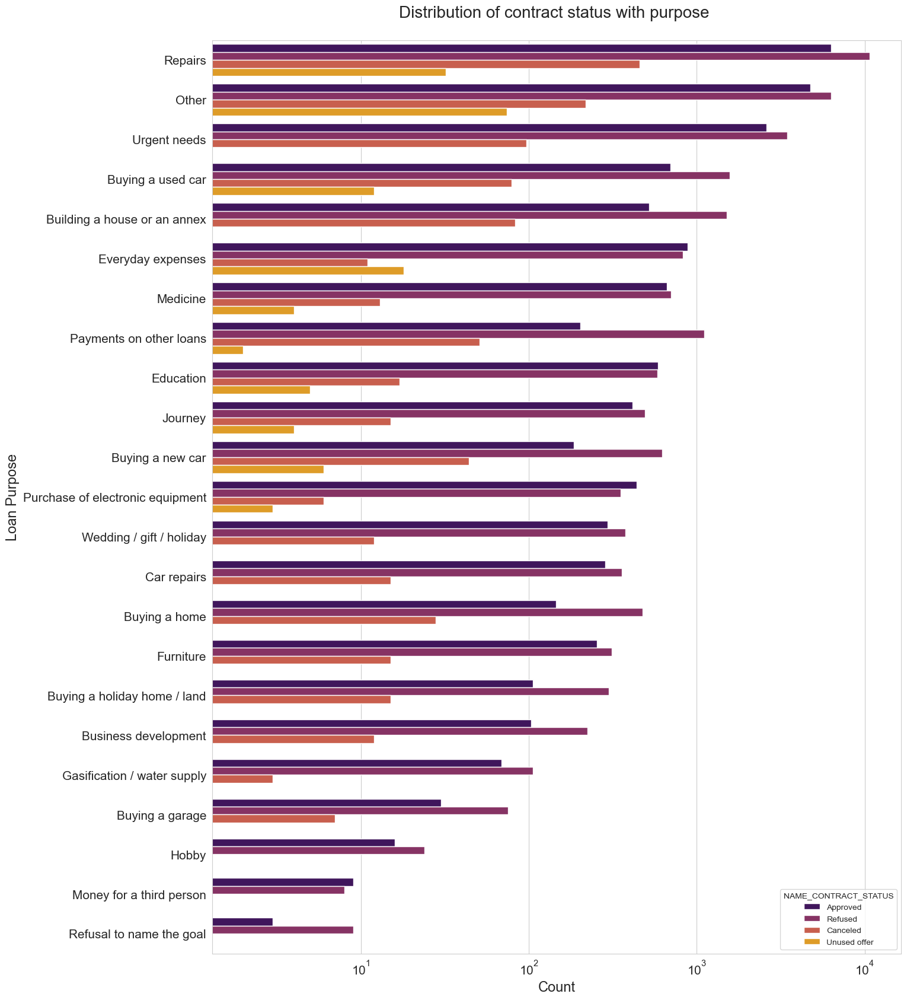

In [106]:
## Performing Univariate Analysis for the Distribution of Contract Status:

plt.figure(figsize=[15,20])

sns.countplot(data = merge_data, y='NAME_CASH_LOAN_PURPOSE', order=merge_data['NAME_CASH_LOAN_PURPOSE']
             .value_counts().index, hue='NAME_CONTRACT_STATUS', palette = 'inferno')

plt.title('Distribution of contract status with purpose \n', fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('Count', fontsize=17)
plt.ylabel('Loan Purpose', fontsize=17)
plt.xscale('log')
plt.show()

## Conclusion:
  1. Refusal of loan is high in all type of category
  2. Highest number of approval is for Reapir needs, other category and  Urgent needs.
  3. Building a house, Paying other loans and Buying a new car have considerably higher refusal rate than their          approval

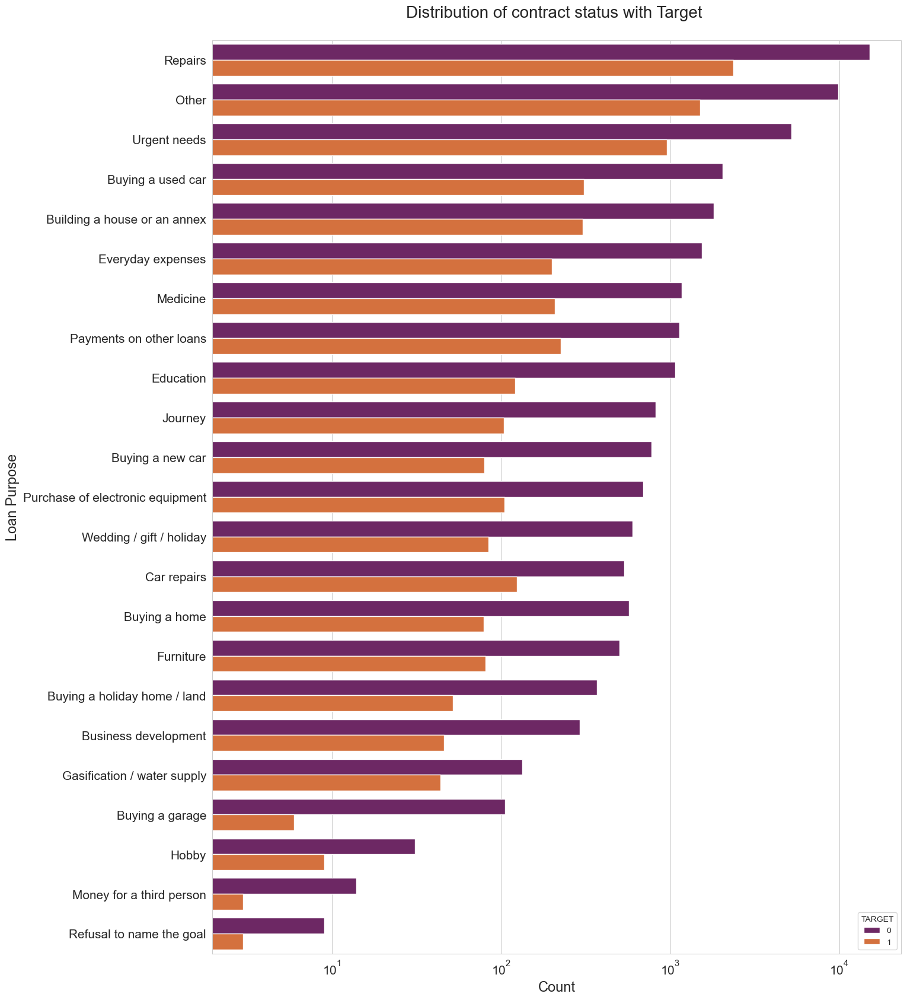

In [107]:
# Plotting for the Contract status with target:

plt.figure(figsize=[15,20])

sns.countplot(data = merge_data, y='NAME_CASH_LOAN_PURPOSE', order=merge_data['NAME_CASH_LOAN_PURPOSE']
             .value_counts().index, hue='TARGET', palette = 'inferno')

plt.title('Distribution of contract status with Target \n', fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('Count', fontsize=17)
plt.ylabel('Loan Purpose', fontsize=17)
plt.xscale('log')
plt.show()

## Conclusion:
   1. Loan purpose with 'Repair' category are facing more difficulties in repaying the loan but they are the one with lessar default.
   2. Buying a garage, Business deveopment, Buying a holiday home/land, Buying a home have have better repaying capability.
   3. Therefor more focus is required on these category to decrese the default rate.

In [108]:
merge_data.head()

,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,AGE_IN_YEARS,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,CNT_FAM_MEMBERS,ORGANIZATION_TYPE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,AMT_INCOME_RANGE,AMT_CREDIT_RANGE,AGE_GROUP,SK_ID_PREV,NAME_CONTRACT_TYPE_P,AMT_APPLICATION,AMT_CREDIT_P,WEEKDAY_APPR_PROCESS_START_P,HOUR_APPR_PROCESS_START_P,FLAG_LAST_APPL_PER_CONTRACT,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,NAME_YIELD_GROUP,PRODUCT_COMBINATION
0,0,Revolving loans,M,N,Y,0,90000.0,180000.0,9000.0,180000.0,Unaccompanied,Working,Higher education,Single / not married,With parents,0.030755,29,-1010,-4799.0,-3015,1.0,Business Entity Type 3,0.0,0.0,0.0,0.0,-599.0,0.0,0.0,0.0,0.0,0.0,0.0,75000-100000,150000-200000,"(25, 35]",1390369,Cash loans,94500.0,109971.0,FRIDAY,11,Y,Other,Approved,-599,Cash through the bank,XAP,New,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,high,Cash Street: high
1,0,Cash loans,F,N,Y,0,292500.0,665892.0,24592.5,477000.0,Unaccompanied,Commercial associate,Secondary / secondary special,Civil marriage,House / apartment,0.025164,42,-2668,-5266.0,-3787,2.0,Business Entity Type 3,0.0,0.0,0.0,0.0,-1634.0,0.0,0.0,0.0,1.0,0.0,5.0,275000-300000,700000-750000,"(35, 45]",1344613,Cash loans,1260000.0,1260000.0,WEDNESDAY,14,Y,Payments on other loans,Refused,-119,Cash through the bank,HC,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,low_action,Cash Street: low
2,0,Cash loans,M,Y,N,1,360000.0,733315.5,39069.0,679500.0,Unaccompanied,Commercial associate,Secondary / secondary special,Married,House / apartment,0.015221,33,-2060,-3557.0,-3557,3.0,Self-employed,2.0,0.0,2.0,0.0,-697.0,0.0,0.0,0.0,0.0,1.0,1.0,350000-375000,750000-800000,"(25, 35]",1077565,Cash loans,1350000.0,1487214.0,MONDAY,14,Y,Buying a used car,Approved,-695,Cash through the bank,XAP,Refreshed,XNA,Cash,walk-in,Channel of corporate sales,-1,XNA,low_normal,Cash Street: low
3,0,Revolving loans,M,Y,Y,0,180000.0,540000.0,27000.0,540000.0,Unaccompanied,Working,Higher education,Married,House / apartment,0.025164,45,-1761,-8236.0,-4292,2.0,Business Entity Type 3,1.0,0.0,1.0,0.0,-540.0,0.0,0.0,0.0,1.0,0.0,1.0,175000-200000,550000-600000,"(35, 45]",1223113,Cash loans,337500.0,407911.5,MONDAY,13,Y,Repairs,Approved,-539,Cash through the bank,XAP,New,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,low_normal,Cash Street: low
4,0,Revolving loans,M,Y,Y,0,180000.0,540000.0,27000.0,540000.0,Unaccompanied,Working,Higher education,Married,House / apartment,0.025164,45,-1761,-8236.0,-4292,2.0,Business Entity Type 3,1.0,0.0,1.0,0.0,-540.0,0.0,0.0,0.0,1.0,0.0,1.0,175000-200000,550000-600000,"(35, 45]",1529558,Cash loans,450000.0,555723.0,MONDAY,15,Y,Repairs,Refused,-449,Cash through the bank,LIMIT,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,low_normal,Cash Street: low


# Performing Bivariate analysis

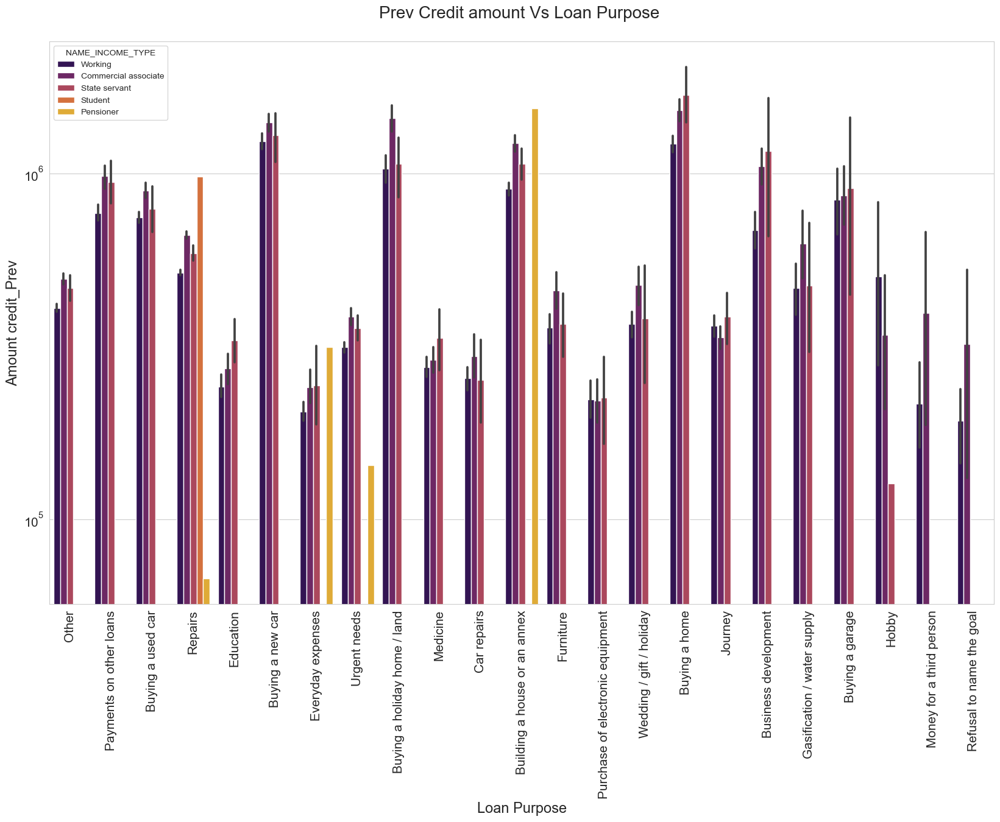

In [119]:
# Plotting for credit amount in logrithimic scale

plt.figure(figsize=(20,12))

sns.barplot(data = merge_data, x='NAME_CASH_LOAN_PURPOSE', hue='NAME_INCOME_TYPE', y='AMT_CREDIT_P',orient='v', palette = 'inferno')
plt.xticks(rotation=90)
plt.title('Prev Credit amount Vs Loan Purpose \n', fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('Loan Purpose', fontsize=17)
plt.ylabel('Amount credit_Prev', fontsize=17)
plt.yscale('log')
plt.show()

## Conclusion:
  1. Higher amount of loan to 'buying new car', 'Buying a holiday home/land','Buying a house','Buying a home' type of 
     category.
  2. Pensioner are the highest among those opting loan for purpose of 'Building a house or an annex'
  3. Among Repair Purpose 'Students' were among the highest.
  4. Lessar Credit for 'third person' or 'Hobby' category loan purpose.
  5. Overall Income type of 'State servant' have significant credit applied specially for Buying a home purpose.

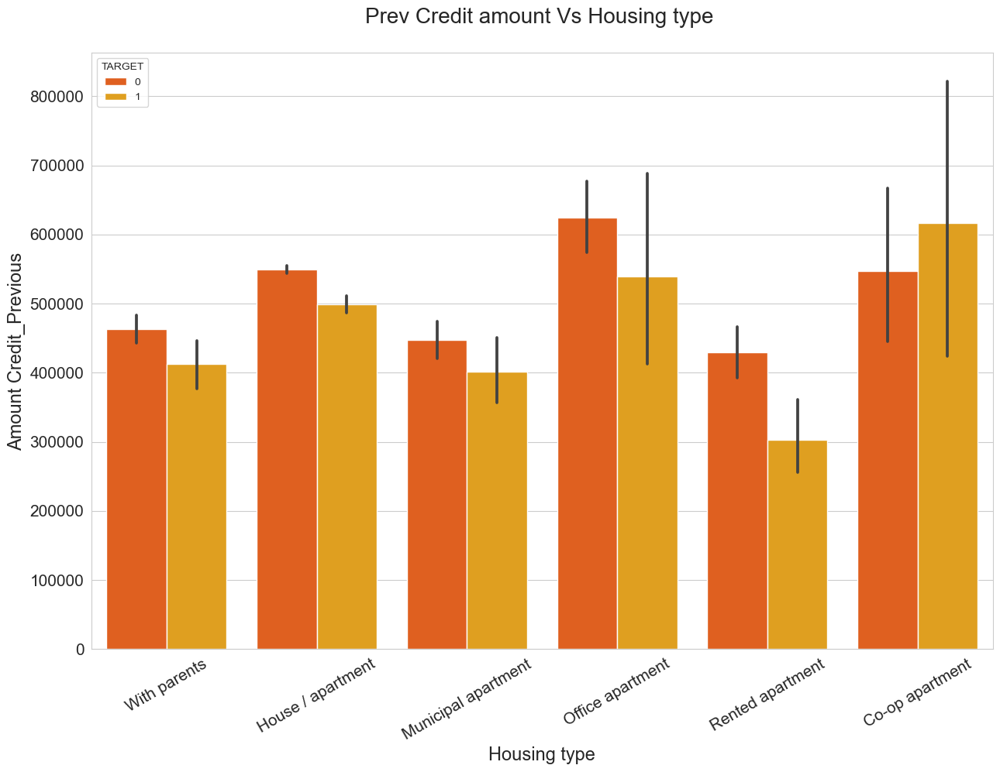

In [121]:
# Plotting for Credit amount previous vs Housing type

plt.figure(figsize=(15,10))

sns.barplot(data = merge_data, y='AMT_CREDIT_P', hue='TARGET', x='NAME_HOUSING_TYPE', palette = 'autumn')
plt.xticks(rotation=30)
plt.title('Prev Credit amount Vs Housing type \n', fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('Housing type', fontsize=17)
plt.ylabel('Amount Credit_Previous', fontsize=17)

plt.show()

## Conclusion;
   1. Co-op apartment are having highest payment difficulty for paying their dues.
   2. Credit alloted for rented apartment section is the lowest although compratively they have lessar defaults.
   3. Maximum credibility is for Housing type 'Office apartment' since they have consistent cash flow to pay the dues.

In [ ]:
######################## END ##########################